In [1]:
import os
import sys
import math
import argparse
import numpy as np
import pandas as pd
from collections import defaultdict, Counter
from sklearn.decomposition import PCA
from typing import Dict, List, Tuple, Iterable, Union, Optional, Set, Sequence, Callable, DefaultDict, Any

# Keras imports
import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import LeakyReLU, PReLU, ELU, ThresholdedReLU, Lambda, Reshape, LayerNormalization
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, Callback
from tensorflow.keras.layers import SpatialDropout1D, SpatialDropout2D, SpatialDropout3D, add, concatenate
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization, Activation, Flatten, LSTM, RepeatVector
from tensorflow.keras.layers import Conv1D, Conv2D, Conv3D, UpSampling1D, UpSampling2D, UpSampling3D, MaxPooling1D
from tensorflow.keras.layers import MaxPooling2D, MaxPooling3D, AveragePooling1D, AveragePooling2D, AveragePooling3D, Layer
from tensorflow.keras.layers import SeparableConv1D, SeparableConv2D, DepthwiseConv2D, Concatenate, Add
from tensorflow.keras.layers import GlobalAveragePooling1D, GlobalAveragePooling2D, GlobalAveragePooling3D

%matplotlib inline
import matplotlib.pyplot as plt


# ml4h Imports
from ml4h.TensorMap import TensorMap
from ml4h.arguments import parse_args
from ml4h.plots import _plot_reconstruction
from ml4h.models import make_multimodal_multitask_model, train_model_from_generators, make_hidden_layer_model, _conv_layer_from_kind_and_dimension
from ml4h.tensor_generators import TensorGenerator, big_batch_from_minibatch_generator, test_train_valid_tensor_generators
from ml4h.recipes import plot_predictions, infer_hidden_layer_multimodal_multitask


Tensor = tf.Tensor

ACTIVATION_CLASSES = {
    'leaky': LeakyReLU(),
    'prelu': PReLU(),
    'elu': ELU(),
    'thresh_relu': ThresholdedReLU,
}
ACTIVATION_FUNCTIONS = {
    'swish': tf.nn.swish,
    'gelu': tfa.activations.gelu,
    'lisht': tfa.activations.lisht,
    'mish': tfa.activations.mish,
}
NORMALIZATION_CLASSES = {
    'batch_norm': BatchNormalization,
    'layer_norm': LayerNormalization,
    'instance_norm': tfa.layers.InstanceNormalization,
    'poincare_norm': tfa.layers.PoincareNormalize,
}
CONV_REGULARIZATION_CLASSES = {
    # class name -> (dimension -> class)
    'spatial_dropout': {2: SpatialDropout1D, 3: SpatialDropout2D, 4: SpatialDropout3D},
    'dropout': defaultdict(lambda _: Dropout),
}
DENSE_REGULARIZATION_CLASSES = {
    'dropout': Dropout,  # TODO: add l1, l2
}

In [2]:

def _activation_layer(activation: str) -> Activation:
    return (
        ACTIVATION_CLASSES.get(activation, None)
        or Activation(ACTIVATION_FUNCTIONS.get(activation, None) or activation)
    )


def _normalization_layer(norm: str) -> Layer:
    if not norm:
        return lambda x: x
    return NORMALIZATION_CLASSES[norm]()


def _regularization_layer(dimension: int, regularization_type: str, rate: float):
    if not regularization_type:
        return lambda x: x
    if regularization_type in DENSE_REGULARIZATION_CLASSES:
        return DENSE_REGULARIZATION_CLASSES[regularization_type](rate)
    return CONV_REGULARIZATION_CLASSES[regularization_type][dimension](rate)


def _calc_start_shape(
        num_upsamples: int, output_shape: Tuple[int, ...], upsample_rates: Sequence[int], channels: int,
) -> Tuple[int, ...]:
    """
    Given the number of blocks in the decoder and the upsample rates, return required input shape to get to output shape
    """
    upsample_rates = list(upsample_rates) + [1] * len(output_shape)
    return tuple((shape // rate**num_upsamples for shape, rate in zip(output_shape[:-1], upsample_rates))) + (channels,)


class FlatToStructure:
    """Takes a flat input, applies a dense layer, then restructures to output_shape"""
    def __init__(
            self,
            output_shape: Tuple[int, ...],
            activation: str,
            normalization: str,
    ):
        self.input_shapes = output_shape
        self.dense = Dense(units=int(np.prod(output_shape)))
        self.activation = _activation_layer(activation)
        self.reshape = Reshape(output_shape)
        self.norm = _normalization_layer(normalization)

    def __call__(self, x: Tensor) -> Tensor:
        return self.reshape(self.norm(self.activation(self.dense(x))))


def _conv_layer_from_kind_and_dimension(
        dimension: int, conv_layer_type: str, conv_x: List[int], conv_y: List[int], conv_z: List[int],
) -> Tuple[Layer, List[Tuple[int, ...]]]:
    if dimension == 4 and conv_layer_type == 'conv':
        conv_layer = Conv3D
        kernel = zip(conv_x, conv_y, conv_z)
    elif dimension == 3 and conv_layer_type == 'conv':
        conv_layer = Conv2D
        kernel = zip(conv_x, conv_y)
    elif dimension == 2 and conv_layer_type == 'conv':
        conv_layer = Conv1D
        kernel = zip(conv_x)
    elif dimension == 3 and conv_layer_type == 'separable':
        conv_layer = SeparableConv2D
        kernel = zip(conv_x, conv_y)
    elif dimension == 2 and conv_layer_type == 'separable':
        conv_layer = SeparableConv1D
        kernel = zip(conv_x)
    elif dimension == 3 and conv_layer_type == 'depth':
        conv_layer = DepthwiseConv2D
        kernel = zip(conv_x, conv_y)
    else:
        raise ValueError(f'Unknown convolution type: {conv_layer_type} for dimension: {dimension}')
    return conv_layer, list(kernel)


def _upsampler(dimension, pool_x, pool_y, pool_z):
    if dimension == 4:
        return UpSampling3D(size=(pool_x, pool_y, pool_z))
    elif dimension == 3:
        return UpSampling2D(size=(pool_x, pool_y))
    elif dimension == 2:
        return UpSampling1D(size=pool_x)
    

    
def _one_by_n_kernel(dimension):
    return tuple([1] * (dimension - 1))


class DenseConvolutionalBlock:
    def __init__(
            self,
            *,
            dimension: int,
            block_size: int,
            conv_layer_type: str,
            filters: int,
            conv_x: List[int],
            conv_y: List[int],
            conv_z: List[int],
            activation: str,
            normalization: str,
            regularization: str,
            regularization_rate: float,
    ):
        conv_layer, kernels = _conv_layer_from_kind_and_dimension(dimension, conv_layer_type, conv_x, conv_y, conv_z)
        if isinstance(conv_layer, DepthwiseConv2D):
            self.conv_layers = [conv_layer(kernel_size=kernel, padding='same') for kernel in kernels]
        else:
            self.conv_layers = [conv_layer(filters=filters, kernel_size=kernel, padding='same') for kernel in kernels]
        self.activations = [_activation_layer(activation) for _ in range(block_size)]
        self.normalizations = [_normalization_layer(normalization) for _ in range(block_size)]
        self.regularizations = [_regularization_layer(dimension, regularization, regularization_rate) for _ in range(block_size)]
        print(f'Dense Block Convolutional Layers (num_filters, kernel_size): {list(zip([filters]*len(kernels), kernels))}')

    def __call__(self, x: Tensor) -> Tensor:
        dense_connections = [x]
        for i, (convolve, activate, normalize, regularize) in enumerate(
            zip(
                    self.conv_layers, self.activations, self.normalizations, self.regularizations,
            ),
        ):
            x = normalize(regularize(activate(convolve(x))))
            if i < len(self.conv_layers) - 1:  # output of block does not get concatenated to
                dense_connections.append(x)
                x = Concatenate()(dense_connections[:])  # [:] is necessary because of tf weirdness
        return x

    
class ConvDecoder2:
    def __init__(
            self,
            *,
            tensor_map_out: TensorMap,
            filters_per_dense_block: List[int],
            conv_layer_type: str,
            conv_x: List[int],
            conv_y: List[int],
            conv_z: List[int],
            block_size: int,
            activation: str,
            normalization: str,
            regularization: str,
            regularization_rate: float,
            upsample_x: int,
            upsample_y: int,
            upsample_z: int,
    ):
        dimension = tensor_map_out.axes()
        self.dense_blocks = [
            DenseConvolutionalBlock(
                dimension=tensor_map_out.axes(), conv_layer_type=conv_layer_type, filters=filters, conv_x=[x]*block_size,
                conv_y=[y]*block_size, conv_z=[z]*block_size, block_size=block_size, activation=activation, normalization=normalization,
                regularization=regularization, regularization_rate=regularization_rate,
            )
            for filters, x, y, z in zip(filters_per_dense_block, conv_x, conv_y, conv_z)
        ]
        conv_layer, _ = _conv_layer_from_kind_and_dimension(dimension, 'conv', conv_x, conv_y, conv_z)
        self.conv_label = conv_layer(tensor_map_out.shape[-1], _one_by_n_kernel(dimension), activation=tensor_map_out.activation, name=tensor_map_out.output_name())
        self.upsamples = [_upsampler(dimension, upsample_x, upsample_y, upsample_z) for _ in range(len(filters_per_dense_block) + 1)]
        print(f'Decode has: {list(enumerate(zip(self.dense_blocks, self.upsamples)))}')
    def __call__(self, x: Tensor) -> Tensor:
        for i, (dense_block, upsample) in enumerate(zip(self.dense_blocks, self.upsamples)):
            
            x = upsample(x)
            x = dense_block(x)
        return self.conv_label(x)
    
    

In [3]:
from tensorflow.keras.layers import Layer
from tensorflow import acos

def l2_norm(x, axis=None):
    """
    takes an input tensor and returns the l2 norm along specified axis
    """

    square_sum = K.sum(K.square(x), axis=axis, keepdims=True)
    norm = K.sqrt(K.maximum(square_sum, K.epsilon()))

    return norm

def pairwise_cosine_difference(t1, t2):
    t1_norm = t1 / l2_norm(t1, axis=-1)
    t2_norm = t2 / l2_norm(t2, axis=-1)
    dot = K.clip(K.batch_dot(t1, t2), -1, 1)
    return acos(dot)

class CosineLossLayer(Layer):
    """Layer that creates an Cosine loss."""
    def __init__(self, weight):
        super(CosineLossLayer, self).__init__()
        self.weight = weight
    def get_config(self):
        config = super().get_config().copy()
        config.update({'weight': self.weight})
        return config
    def call(self, inputs):
        # We use `add_loss` to create a regularization loss
        # that depends on the inputs.
        self.add_loss(self.weight * pairwise_cosine_difference(inputs[0], inputs[1]))
        return inputs

class L2LossLayer(Layer):
    """Layer that creates an L2 loss."""
    def __init__(self, weight):
        super(L2LossLayer, self).__init__()
        self.weight = weight
        
    def get_config(self):
        config = super().get_config().copy()
        config.update({'weight': self.weight})
        return config
    
    def call(self, inputs):
        self.add_loss(self.weight * tf.reduce_sum(tf.square(inputs[0] - inputs[1])))
        return inputs

In [4]:
def make_paired_autoencoder_model(
    pairs: List[Tuple[TensorMap, TensorMap]],
    pair_loss = 'cosine',
    **kwargs
) -> Model:
    inputs = {tm: Input(shape=tm.shape, name=tm.input_name()) for tm in args.tensor_maps_in}
    original_outputs = {tm:1 for tm in args.tensor_maps_out}
    real_serial_layers = kwargs['model_layers']
    args.model_layers = None
    multimodal_activations = []
    encoders = {}
    decoders = {}
    outputs = []
    losses = []
    for left, right in pairs:
        args.tensor_maps_in = [left]
        left_model = make_multimodal_multitask_model(**args.__dict__)
        encode_left = make_hidden_layer_model(left_model, [left], args.hidden_layer)
        h_left = encode_left(inputs[left])
        
        args.tensor_maps_in = [right]
        right_model = make_multimodal_multitask_model(**args.__dict__)     
        encode_right = make_hidden_layer_model(right_model, [right], args.hidden_layer)
        h_right = encode_right(inputs[right])        
        
        if pair_loss == 'cosine':
            loss_layer = CosineLossLayer(1.0)
        elif pair_loss == 'euclid':
            loss_layer = L2LossLayer(1.0)
        
        paired_embeddings = loss_layer([h_left, h_right])
        multimodal_activations.extend(paired_embeddings)
        if left not in encoders:
            encoders[left] = encode_left
        if right not in encoders:
            encoders[right] = encode_right            
        
    multimodal_activation = Concatenate()(multimodal_activations)
    encoder = Model(inputs=list(inputs.values()), outputs=[multimodal_activation], name='encoder')
    
    # build decoder models
    latent_inputs = Input(shape=(args.dense_layers[0]*len(inputs)), name='input_concept_space')
    pre_decoder_shapes: Dict[TensorMap, Optional[Tuple[int, ...]]] = {}
    for tm in args.tensor_maps_out:
        shape = _calc_start_shape(num_upsamples=len(args.dense_blocks), output_shape=tm.shape, 
                                  upsample_rates=[args.pool_x, args.pool_y, args.pool_z], 
                                  channels=args.dense_blocks[-1])    
        
        restructure = FlatToStructure(output_shape=shape, activation=args.activation, 
                                      normalization=args.dense_normalize)
        
        decode = ConvDecoder2(
            tensor_map_out=tm,
            filters_per_dense_block=args.dense_blocks[::-1],
            conv_layer_type=args.conv_type,
            conv_x=args.conv_x,
            conv_y=args.conv_y,
            conv_z=args.conv_z,
            block_size=args.block_size,
            activation=args.activation,
            normalization=args.conv_normalize,
            regularization=args.conv_regularize,
            regularization_rate=args.conv_regularize_rate,
            upsample_x=args.pool_x,
            upsample_y=args.pool_y,
            upsample_z=args.pool_z,
        )
        
        reconstruction = decode(restructure(latent_inputs))
        decoder = Model(latent_inputs, reconstruction, name=tm.output_name())
        decoders[tm] = decoder
        outputs.append(decoder(multimodal_activation))
        losses.append(tm.loss)

    args.tensor_maps_out =  list(original_outputs.keys())
    args.tensor_maps_in = list(inputs.keys())
    
    m = Model(inputs=list(inputs.values()), outputs=outputs)
    my_metrics = {tm.output_name(): tm.metrics for tm in args.tensor_maps_out}
    opt = Adam(lr=kwargs['learning_rate'], beta_1=0.9, beta_2=0.999, epsilon=1e-08)
    m.compile(optimizer=opt, loss=losses, metrics=my_metrics)
    m.summary()
    
    if real_serial_layers is not None:
        m.load_weights(kwargs['model_layers'], by_name=True)
        print(f"Loaded model weights from:{kwargs['model_layers']}")
        
    return m, encoders, decoders

In [ ]:
sys.argv = ['train', 
            '--tensors', '/mnt/disks/sax-lax-40k-lvm/2020-01-29/', 
            '--input_tensors', 'ecg.ecg_rest', 'mri.cine_segmented_lax_4ch_diastole', 
            '--output_tensors', 'ecg.ecg_rest', 'mri.cine_segmented_lax_4ch_diastole',
            '--activation', 'selu',
            '--conv_layers', '32',
            '--conv_x', '15', '15', '15',
            '--conv_y', '3', '3', '3', 
            '--conv_z', '3', '3', '3',
            '--dense_blocks', '32', '32', '32',
            '--block_size', '3',
            '--dense_layers', '64',
            '--pool_x', '2',
            '--pool_y', '2',
            '--batch_size', '1',
            '--patience', '94',
            '--epochs', '396',
            '--learning_rate', '0.00005',
            '--training_steps', '128',
            '--validation_steps', '30',
            '--test_steps', '8',
            '--num_workers', '4',
            '--inspect_model',
            '--tensormap_prefix', 'ml4h.tensormap.ukb',
            '--model_layers', './recipes_output/paired_ecg_segmented_mri_lax_4ch_diastole_cosine_64d_selu/paired_ecg_segmented_mri_lax_4ch_diastole_cosine_64d_selu.h5',
            '--id', 'paired_ecg_segmented_mri_lax_4ch_diastole_cosine_64d_selu']
args = parse_args()
pairs = [(args.tensor_maps_in[0], args.tensor_maps_in[1])]
overparameterized_model, encoders, decoders = make_paired_autoencoder_model(pairs, pair_loss='cosine', **args.__dict__)
generate_train, generate_valid, generate_test = test_train_valid_tensor_generators(**args.__dict__)
train_model_from_generators(
        overparameterized_model, generate_train, generate_valid, args.training_steps, args.validation_steps, args.batch_size,
        args.epochs, args.patience, args.output_folder, args.id, args.inspect_model, args.inspect_show_labels,
        plot=False, save_last_model=True
)


2020-09-22 12:15:50,209 - logger:25 - INFO - Logging configuration was loaded. Log messages can be found at ./recipes_output/paired_ecg_segmented_mri_lax_4ch_diastole_cosine_64d_selu/log_2020-09-22_12-15_0.log.
2020-09-22 12:15:50,422 - arguments:444 - INFO - Command Line was: 
./scripts/tf.sh train --tensors /mnt/disks/sax-lax-40k-lvm/2020-01-29/ --input_tensors ecg.ecg_rest mri.cine_segmented_lax_4ch_diastole --output_tensors ecg.ecg_rest mri.cine_segmented_lax_4ch_diastole --activation selu --conv_layers 32 --conv_x 15 15 15 --conv_y 3 3 3 --conv_z 3 3 3 --dense_blocks 32 32 32 --block_size 3 --dense_layers 64 --pool_x 2 --pool_y 2 --batch_size 1 --patience 94 --epochs 396 --learning_rate 0.00005 --training_steps 128 --validation_steps 30 --test_steps 8 --num_workers 4 --inspect_model --tensormap_prefix ml4h.tensormap.ukb --model_layers ./recipes_output/paired_ecg_segmented_mri_lax_4ch_diastole_cosine_64d_selu/paired_ecg_segmented_mri_lax_4ch_diastole_cosine_64d_selu.h5 --id paired_

2020-09-22 12:15:53,960 - models:896 - WARNING - Number of x dimensions for convolutional kernel sizes (3) do not match number of convolutional layers/blocks (4), matching values to fit 4 convolutional layers/blocks.
2020-09-22 12:15:53,962 - models:896 - WARNING - Number of y dimensions for convolutional kernel sizes (3) do not match number of convolutional layers/blocks (4), matching values to fit 4 convolutional layers/blocks.
2020-09-22 12:15:53,963 - models:896 - WARNING - Number of z dimensions for convolutional kernel sizes (3) do not match number of convolutional layers/blocks (4), matching values to fit 4 convolutional layers/blocks.
2020-09-22 12:15:53,965 - models:383 - INFO - Residual Block Convolutional Layers (num_filters, kernel_size): [(32, (15, 3))]
2020-09-22 12:15:53,971 - models:421 - INFO - Dense Block Convolutional Layers (num_filters, kernel_size): [(32, (15, 3)), (32, (15, 3)), (32, (15, 3))]
2020-09-22 12:15:53,975 - models:421 - INFO - Dense Block Convolutiona

Dense Block Convolutional Layers (num_filters, kernel_size): [(32, (15,)), (32, (15,)), (32, (15,))]
Dense Block Convolutional Layers (num_filters, kernel_size): [(32, (15,)), (32, (15,)), (32, (15,))]
Dense Block Convolutional Layers (num_filters, kernel_size): [(32, (15,)), (32, (15,)), (32, (15,))]
Decode has: [(0, (<__main__.DenseConvolutionalBlock object at 0x7f237e1e81d0>, <tensorflow.python.keras.layers.convolutional.UpSampling1D object at 0x7f237e1ca5f8>)), (1, (<__main__.DenseConvolutionalBlock object at 0x7f237e1e8748>, <tensorflow.python.keras.layers.convolutional.UpSampling1D object at 0x7f237e1ca940>)), (2, (<__main__.DenseConvolutionalBlock object at 0x7f237e1d7198>, <tensorflow.python.keras.layers.convolutional.UpSampling1D object at 0x7f237e1ca9b0>))]
Dense Block Convolutional Layers (num_filters, kernel_size): [(32, (15, 3)), (32, (15, 3)), (32, (15, 3))]
Dense Block Convolutional Layers (num_filters, kernel_size): [(32, (15, 3)), (32, (15, 3)), (32, (15, 3))]
Dense Bl

2020-09-22 12:16:40,199 - models:1358 - INFO - Spent:36.22 seconds training, Samples trained on:128 Per sample training speed:0.283 seconds.
16/16 [==============================] - 2s 124ms/step
2020-09-22 12:16:42,295 - models:1366 - INFO - Spent:2.09 seconds predicting, Samples inferred:128 Per sample inference speed:0.1309 seconds.
Train for 128 steps, validate for 30 steps
Epoch 1/396
127/128 [============================>.] - ETA: 0s - loss: 1.8509 - output_strip_continuous_loss: 0.5753 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1625 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9356 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9749 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output

Epoch 2/396
127/128 [============================>.] - ETA: 0s - loss: 1.8364 - output_strip_continuous_loss: 0.5593 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1392 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9444 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9791 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0207 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6425 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6507 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3417 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmente

Epoch 3/396
127/128 [============================>.] - ETA: 0s - loss: 2.1481 - output_strip_continuous_loss: 0.5740 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1393 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9446 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9798 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0262 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6348 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6612 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3645 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmente

Epoch 4/396
127/128 [============================>.] - ETA: 0s - loss: 2.0205 - output_strip_continuous_loss: 0.5162 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1437 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9427 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9789 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0212 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6034 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.5999 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.2412 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmente

Epoch 5/396
127/128 [============================>.] - ETA: 0s - loss: 1.8405 - output_strip_continuous_loss: 0.5336 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1443 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9423 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9791 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0218 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6133 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6557 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.2426 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmente

Epoch 6/396
127/128 [============================>.] - ETA: 0s - loss: 2.1259 - output_strip_continuous_loss: 0.5236 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1428 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9440 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9799 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0344 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6104 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6423 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3778 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmente

Epoch 7/396
127/128 [============================>.] - ETA: 0s - loss: 2.1880 - output_strip_continuous_loss: 0.5432 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1358 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9459 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9808 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6618 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6595 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3752 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segm

Epoch 8/396
127/128 [============================>.] - ETA: 0s - loss: 1.7375 - output_strip_continuous_loss: 0.5375 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1363 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9446 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9788 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0269 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0392 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6502 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6594 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3697 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_la

Epoch 9/396
127/128 [============================>.] - ETA: 0s - loss: 1.8370 - output_strip_continuous_loss: 0.4855 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1394 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9463 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9803 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0214 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0410 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6416 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6735 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4279 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_la

Epoch 10/396
127/128 [============================>.] - ETA: 0s - loss: 1.8257 - output_strip_continuous_loss: 0.5391 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1487 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9410 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9778 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0079 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0401 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6210 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6538 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3832 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 11/396
127/128 [============================>.] - ETA: 0s - loss: 1.9861 - output_strip_continuous_loss: 0.5064 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1686 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9352 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9757 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0575 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5980 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6011 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3247 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segment

Epoch 12/396
127/128 [============================>.] - ETA: 0s - loss: 1.7901 - output_strip_continuous_loss: 0.4947 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1575 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9389 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9770 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0039 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5718 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6246 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.2994 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segment

Epoch 13/396
127/128 [============================>.] - ETA: 0s - loss: 1.7088 - output_strip_continuous_loss: 0.5132 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1567 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9383 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9776 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0319 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5788 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6148 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3875 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segment

Epoch 14/396
127/128 [============================>.] - ETA: 0s - loss: 1.8306 - output_strip_continuous_loss: 0.4871 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1314 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9471 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9807 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0110 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0394 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6678 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6415 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4309 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 15/396
127/128 [============================>.] - ETA: 0s - loss: 1.9857 - output_strip_continuous_loss: 0.4882 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1370 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9467 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9807 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0273 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6600 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7044 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4230 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segment

Epoch 16/396
127/128 [============================>.] - ETA: 0s - loss: 1.8897 - output_strip_continuous_loss: 0.5007 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1274 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9503 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9832 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0367 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0217 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6529 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6936 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4483 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 17/396
127/128 [============================>.] - ETA: 0s - loss: 1.8431 - output_strip_continuous_loss: 0.4643 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1173 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9535 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9839 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0417 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7044 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7016 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5394 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segment

Epoch 18/396
127/128 [============================>.] - ETA: 0s - loss: 1.7513 - output_strip_continuous_loss: 0.4724 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1163 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9537 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9843 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0462 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6768 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7045 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5358 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segment

Epoch 19/396
127/128 [============================>.] - ETA: 0s - loss: 1.8293 - output_strip_continuous_loss: 0.4985 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1187 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9527 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9836 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0510 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0073 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6787 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6960 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5180 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 20/396
127/128 [============================>.] - ETA: 0s - loss: 1.8459 - output_strip_continuous_loss: 0.4689 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1154 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9532 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9828 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0236 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0404 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6985 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6869 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5428 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 21/396
127/128 [============================>.] - ETA: 0s - loss: 1.6532 - output_strip_continuous_loss: 0.4501 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1146 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9534 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9843 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0236 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0759 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6768 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6710 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4787 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 22/396
127/128 [============================>.] - ETA: 0s - loss: 1.6590 - output_strip_continuous_loss: 0.4586 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1119 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9555 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9850 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0512 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1005 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6695 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6874 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4848 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 23/396
127/128 [============================>.] - ETA: 0s - loss: 1.7029 - output_strip_continuous_loss: 0.4445 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1205 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9534 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9838 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0413 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6807 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7117 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4591 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segment

Epoch 24/396
127/128 [============================>.] - ETA: 0s - loss: 1.5874 - output_strip_continuous_loss: 0.4323 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1161 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9538 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9836 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0394 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0773 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6891 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7107 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4706 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 25/396
127/128 [============================>.] - ETA: 0s - loss: 1.8448 - output_strip_continuous_loss: 0.4627 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1204 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9524 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9827 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0277 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0806 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6758 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6917 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5208 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 26/396
127/128 [============================>.] - ETA: 0s - loss: 1.8656 - output_strip_continuous_loss: 0.4548 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1245 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9513 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9829 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0178 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0038 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6799 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7041 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5237 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 27/396
127/128 [============================>.] - ETA: 0s - loss: 1.6455 - output_strip_continuous_loss: 0.4418 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1153 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9538 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9837 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0367 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0399 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6816 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7049 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5043 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 28/396
127/128 [============================>.] - ETA: 0s - loss: 1.8832 - output_strip_continuous_loss: 0.4827 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1141 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9546 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9852 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0538 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0893 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6513 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6797 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4489 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 29/396
127/128 [============================>.] - ETA: 0s - loss: 1.7775 - output_strip_continuous_loss: 0.4441 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1213 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9527 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9839 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0231 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0547 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6656 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6699 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4775 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 30/396
127/128 [============================>.] - ETA: 0s - loss: 1.7024 - output_strip_continuous_loss: 0.4348 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1049 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9574 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9859 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0197 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1054 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7092 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6995 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5342 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 31/396
127/128 [============================>.] - ETA: 0s - loss: 1.7625 - output_strip_continuous_loss: 0.4647 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1105 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9557 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9853 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0440 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0618 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6955 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6952 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5236 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 32/396
127/128 [============================>.] - ETA: 0s - loss: 1.5011 - output_strip_continuous_loss: 0.4449 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1162 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9543 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9840 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0079 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0529 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6792 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7161 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5313 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 33/396
127/128 [============================>.] - ETA: 0s - loss: 1.4306 - output_strip_continuous_loss: 0.4258 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1143 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9544 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9847 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0315 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0697 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6848 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7032 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4940 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 34/396
127/128 [============================>.] - ETA: 0s - loss: 1.5829 - output_strip_continuous_loss: 0.4080 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1112 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9558 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9842 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0183 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1643 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6998 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6965 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5548 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 35/396
127/128 [============================>.] - ETA: 0s - loss: 1.7440 - output_strip_continuous_loss: 0.4113 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1205 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9540 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9844 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0144 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0673 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6534 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7180 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4792 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 36/396
127/128 [============================>.] - ETA: 0s - loss: 1.8432 - output_strip_continuous_loss: 0.4257 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1065 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9578 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9859 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0098 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1140 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7145 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7160 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4700 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 37/396
127/128 [============================>.] - ETA: 0s - loss: 1.6092 - output_strip_continuous_loss: 0.4143 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1065 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9576 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9859 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0311 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2074 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6797 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7224 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5750 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 38/396
127/128 [============================>.] - ETA: 0s - loss: 1.7933 - output_strip_continuous_loss: 0.4240 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1077 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9570 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9859 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0748 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1155 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6928 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7197 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5124 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 39/396
127/128 [============================>.] - ETA: 0s - loss: 1.7872 - output_strip_continuous_loss: 0.4205 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1051 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9579 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9862 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0079 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1743 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7105 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7089 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5340 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 40/396
127/128 [============================>.] - ETA: 0s - loss: 1.6856 - output_strip_continuous_loss: 0.3897 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1085 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9568 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9859 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0295 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1360 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7062 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7153 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5535 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 41/396
127/128 [============================>.] - ETA: 0s - loss: 1.6522 - output_strip_continuous_loss: 0.4108 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1035 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9583 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9864 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0197 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1342 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6831 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7282 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5392 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 42/396
127/128 [============================>.] - ETA: 0s - loss: 2.1614 - output_strip_continuous_loss: 0.4133 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1155 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9538 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9840 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0376 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1247 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6705 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7158 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4292 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 43/396
127/128 [============================>.] - ETA: 0s - loss: 1.6145 - output_strip_continuous_loss: 0.4196 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1064 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9573 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9858 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0538 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1204 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6945 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7167 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5144 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 44/396
127/128 [============================>.] - ETA: 0s - loss: 1.9579 - output_strip_continuous_loss: 0.4330 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1149 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9543 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9840 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0215 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1695 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6781 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7006 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5045 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 45/396
127/128 [============================>.] - ETA: 0s - loss: 1.5880 - output_strip_continuous_loss: 0.3984 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1012 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9595 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9867 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0727 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1100 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7132 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7549 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5387 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 46/396
127/128 [============================>.] - ETA: 0s - loss: 1.9515 - output_strip_continuous_loss: 0.3888 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1033 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9583 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9860 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0344 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1521 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6970 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7292 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5871 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 47/396
127/128 [============================>.] - ETA: 0s - loss: 1.8110 - output_strip_continuous_loss: 0.3995 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1005 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9596 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9870 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0529 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1201 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7074 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7394 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5808 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 48/396
127/128 [============================>.] - ETA: 0s - loss: 1.6037 - output_strip_continuous_loss: 0.3898 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1008 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9597 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9871 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0543 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1619 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7033 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7494 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5784 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 49/396
127/128 [============================>.] - ETA: 0s - loss: 2.1776 - output_strip_continuous_loss: 0.6909 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.2004 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9240 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9730 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0169 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.4775 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.4644 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.2050 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segment

Epoch 50/396
127/128 [============================>.] - ETA: 0s - loss: 1.8507 - output_strip_continuous_loss: 0.4449 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1442 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9445 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9826 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0259 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5462 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.5937 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3002 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segment

Epoch 51/396
127/128 [============================>.] - ETA: 0s - loss: 1.5912 - output_strip_continuous_loss: 0.4425 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1345 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9468 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9836 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0157 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0236 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.5793 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6138 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.2764 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 52/396
127/128 [============================>.] - ETA: 0s - loss: 1.5941 - output_strip_continuous_loss: 0.3959 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1097 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9561 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9871 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0262 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0683 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6664 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6740 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4857 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 53/396
127/128 [============================>.] - ETA: 0s - loss: 1.6761 - output_strip_continuous_loss: 0.4003 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1132 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9565 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9868 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0236 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0590 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7037 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7037 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4904 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 54/396
127/128 [============================>.] - ETA: 0s - loss: 1.3875 - output_strip_continuous_loss: 0.3942 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1028 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9594 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9880 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0436 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1703 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7046 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6640 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5331 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 55/396
 64/128 [==============>...............] - ETA: 5s - loss: 1.4053 - output_strip_continuous_loss: 0.4101 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1116 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9566 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9876 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1231 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6644 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6948 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4916 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segment

127/128 [============================>.] - ETA: 0s - loss: 1.5871 - output_strip_continuous_loss: 0.4117 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1117 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9564 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9870 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1180 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6735 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6867 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4504 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_di

Epoch 56/396
127/128 [============================>.] - ETA: 0s - loss: 1.7032 - output_strip_continuous_loss: 0.3897 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1014 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9594 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9879 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0256 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2004 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6908 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7050 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5060 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 57/396
127/128 [============================>.] - ETA: 0s - loss: 1.4891 - output_strip_continuous_loss: 0.4478 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1013 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9599 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9881 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0434 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1785 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6923 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7084 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5529 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 58/396
127/128 [============================>.] - ETA: 0s - loss: 1.5416 - output_strip_continuous_loss: 0.3564 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0968 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9610 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9884 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0118 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2076 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7128 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6915 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5617 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 59/396
127/128 [============================>.] - ETA: 0s - loss: 1.6778 - output_strip_continuous_loss: 0.3943 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0961 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9618 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9885 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0394 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2284 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7424 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7221 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5290 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 60/396
127/128 [============================>.] - ETA: 0s - loss: 1.6602 - output_strip_continuous_loss: 0.3487 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0994 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9612 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9882 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0783 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2125 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7152 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6901 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5644 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 61/396
127/128 [============================>.] - ETA: 0s - loss: 1.7493 - output_strip_continuous_loss: 0.3672 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0957 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9620 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9888 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0244 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3103 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7246 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7239 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5369 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 62/396
127/128 [============================>.] - ETA: 0s - loss: 1.4951 - output_strip_continuous_loss: 0.3863 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0946 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9618 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9884 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0322 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2451 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7160 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6938 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5704 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 63/396
127/128 [============================>.] - ETA: 0s - loss: 1.7741 - output_strip_continuous_loss: 0.4142 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0983 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9614 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9890 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0531 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2904 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7158 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7046 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5627 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 64/396
127/128 [============================>.] - ETA: 0s - loss: 1.6319 - output_strip_continuous_loss: 0.3436 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1010 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9606 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9883 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0646 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1668 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7250 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7139 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5416 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 65/396
127/128 [============================>.] - ETA: 0s - loss: 1.6864 - output_strip_continuous_loss: 0.3773 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0970 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9619 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9886 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0246 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2189 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6974 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6809 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5578 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 66/396
127/128 [============================>.] - ETA: 0s - loss: 1.8652 - output_strip_continuous_loss: 0.4000 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1047 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9589 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9880 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0345 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2173 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7100 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6824 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5470 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 67/396
127/128 [============================>.] - ETA: 0s - loss: 1.7325 - output_strip_continuous_loss: 0.3753 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0956 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9622 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9895 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0291 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2540 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7401 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7013 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5286 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 68/396
127/128 [============================>.] - ETA: 0s - loss: 1.6521 - output_strip_continuous_loss: 0.3924 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0970 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9612 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9885 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0144 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1709 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7243 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6864 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5186 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 69/396
127/128 [============================>.] - ETA: 0s - loss: 1.7686 - output_strip_continuous_loss: 0.3651 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0925 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9627 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9886 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0643 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2594 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7183 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7395 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5551 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 70/396
127/128 [============================>.] - ETA: 0s - loss: 1.7315 - output_strip_continuous_loss: 0.3724 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0976 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9617 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9888 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0210 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2918 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7177 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6996 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5341 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 71/396
127/128 [============================>.] - ETA: 0s - loss: 1.6798 - output_strip_continuous_loss: 0.3723 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0953 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9623 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9889 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0262 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1996 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7137 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7198 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5719 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 72/396
127/128 [============================>.] - ETA: 0s - loss: 1.8417 - output_strip_continuous_loss: 0.3376 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0941 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9626 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9886 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0236 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2533 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7297 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7351 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6184 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 73/396
127/128 [============================>.] - ETA: 0s - loss: 1.7209 - output_strip_continuous_loss: 0.3403 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0942 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9621 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9882 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0079 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2862 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7224 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7402 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6065 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 74/396
127/128 [============================>.] - ETA: 0s - loss: 1.8537 - output_strip_continuous_loss: 0.3689 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0996 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9612 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9885 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0079 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2101 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7062 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7244 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5861 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 75/396
127/128 [============================>.] - ETA: 0s - loss: 1.6260 - output_strip_continuous_loss: 0.3627 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1007 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9606 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9875 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0079 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3028 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7195 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7290 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5480 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 76/396
127/128 [============================>.] - ETA: 0s - loss: 1.7846 - output_strip_continuous_loss: 0.3522 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0966 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9621 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9890 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0276 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2499 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7107 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7065 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5106 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 77/396
127/128 [============================>.] - ETA: 0s - loss: 1.9173 - output_strip_continuous_loss: 0.3837 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0989 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9616 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9889 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0232 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2636 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7237 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7046 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5215 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 78/396
127/128 [============================>.] - ETA: 0s - loss: 1.4729 - output_strip_continuous_loss: 0.3627 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0960 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9623 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9891 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0691 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2503 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7023 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7206 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5536 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 79/396
127/128 [============================>.] - ETA: 0s - loss: 1.7467 - output_strip_continuous_loss: 0.3684 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0920 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9629 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9888 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0308 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2958 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7276 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7042 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5218 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 80/396
127/128 [============================>.] - ETA: 0s - loss: 1.8318 - output_strip_continuous_loss: 0.3851 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0862 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9654 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9903 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0472 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2843 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7363 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7370 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5734 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 81/396
127/128 [============================>.] - ETA: 0s - loss: 1.8405 - output_strip_continuous_loss: 0.3629 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0924 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9634 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9889 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0739 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2371 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7302 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7359 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5551 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 82/396
127/128 [============================>.] - ETA: 0s - loss: 1.6292 - output_strip_continuous_loss: 0.3693 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0973 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9621 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9883 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0722 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2479 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7064 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7161 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5610 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 83/396
127/128 [============================>.] - ETA: 0s - loss: 1.7174 - output_strip_continuous_loss: 0.3380 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0931 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9627 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9886 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0361 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2472 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7301 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7213 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5469 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 84/396
127/128 [============================>.] - ETA: 0s - loss: 1.7165 - output_strip_continuous_loss: 0.3868 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0929 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9630 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9886 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0553 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2093 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7167 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7202 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5008 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 85/396
127/128 [============================>.] - ETA: 0s - loss: 1.5303 - output_strip_continuous_loss: 0.3957 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0956 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9624 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9890 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0047 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2387 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7196 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7217 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5144 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 86/396
127/128 [============================>.] - ETA: 0s - loss: 1.6206 - output_strip_continuous_loss: 0.3618 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0962 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9622 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9886 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0501 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2944 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7145 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7072 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5362 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 87/396
127/128 [============================>.] - ETA: 0s - loss: 1.6407 - output_strip_continuous_loss: 0.3363 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0922 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9629 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9885 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0281 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2635 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7332 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7417 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5737 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 88/396
127/128 [============================>.] - ETA: 0s - loss: 1.8232 - output_strip_continuous_loss: 0.3749 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0877 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9649 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9896 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0207 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2641 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7395 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7582 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5781 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 89/396
127/128 [============================>.] - ETA: 0s - loss: 1.6823 - output_strip_continuous_loss: 0.3484 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0970 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9625 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9886 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1060 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2081 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7037 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7403 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5448 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 90/396
127/128 [============================>.] - ETA: 0s - loss: 1.9503 - output_strip_continuous_loss: 0.3735 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0926 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9628 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9884 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1750 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2859 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7166 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7016 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5214 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 91/396
127/128 [============================>.] - ETA: 0s - loss: 1.6490 - output_strip_continuous_loss: 0.3734 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0883 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9643 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9892 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0848 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2542 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7167 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7375 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5535 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 92/396
127/128 [============================>.] - ETA: 0s - loss: 1.9295 - output_strip_continuous_loss: 0.3534 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0919 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9633 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9888 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0725 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3075 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7103 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7368 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5973 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 93/396
127/128 [============================>.] - ETA: 0s - loss: 1.6212 - output_strip_continuous_loss: 0.3965 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0869 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9659 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9901 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0985 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3201 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7548 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7635 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5524 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 94/396
127/128 [============================>.] - ETA: 0s - loss: 1.8666 - output_strip_continuous_loss: 0.3178 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0894 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9642 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9896 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0637 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3093 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7048 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7327 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5705 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 95/396
127/128 [============================>.] - ETA: 0s - loss: 1.7936 - output_strip_continuous_loss: 0.3645 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0933 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9629 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9887 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0157 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2821 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7241 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7476 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5930 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 96/396
127/128 [============================>.] - ETA: 0s - loss: 1.7614 - output_strip_continuous_loss: 0.3612 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0891 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9647 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9897 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0630 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2872 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7386 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7549 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5470 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 97/396
127/128 [============================>.] - ETA: 0s - loss: 1.7263 - output_strip_continuous_loss: 0.3764 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0883 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9647 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9897 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0286 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3014 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7309 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7507 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5891 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 98/396
127/128 [============================>.] - ETA: 0s - loss: 1.7962 - output_strip_continuous_loss: 0.3456 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0901 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9637 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9885 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0142 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2475 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7290 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7507 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5840 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 99/396
127/128 [============================>.] - ETA: 0s - loss: 1.7057 - output_strip_continuous_loss: 0.3317 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0877 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9650 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9893 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0272 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3090 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7525 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7481 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5744 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_l

Epoch 100/396
127/128 [============================>.] - ETA: 0s - loss: 1.8622 - output_strip_continuous_loss: 0.3885 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0883 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9647 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9897 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0362 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2462 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7523 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7481 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5294 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 101/396
127/128 [============================>.] - ETA: 0s - loss: 1.8532 - output_strip_continuous_loss: 0.3517 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0916 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9631 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9885 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2999 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7228 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7468 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5662 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmen

Epoch 102/396
127/128 [============================>.] - ETA: 0s - loss: 1.8211 - output_strip_continuous_loss: 0.3950 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0904 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9643 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9890 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0591 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3841 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7284 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7380 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5755 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 103/396
127/128 [============================>.] - ETA: 0s - loss: 1.8159 - output_strip_continuous_loss: 0.3644 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0909 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9639 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9890 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0312 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3299 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7374 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7540 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5673 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 104/396
127/128 [============================>.] - ETA: 0s - loss: 1.8526 - output_strip_continuous_loss: 0.3757 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0916 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9632 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9887 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0678 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3236 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7169 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7565 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5499 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 105/396
127/128 [============================>.] - ETA: 0s - loss: 1.8623 - output_strip_continuous_loss: 0.4088 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0929 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9630 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9884 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1407 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4087 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7095 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7150 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5832 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 106/396
127/128 [============================>.] - ETA: 0s - loss: 1.5912 - output_strip_continuous_loss: 0.3419 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0866 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9651 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9896 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0118 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3082 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7305 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7385 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5736 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 107/396
127/128 [============================>.] - ETA: 0s - loss: 1.6218 - output_strip_continuous_loss: 0.3395 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0950 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9623 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9881 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0092 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3556 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7276 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7194 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5585 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 108/396
127/128 [============================>.] - ETA: 0s - loss: 1.7766 - output_strip_continuous_loss: 0.3507 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0900 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9639 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9888 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0432 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3476 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7154 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7490 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5548 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 109/396
127/128 [============================>.] - ETA: 0s - loss: 1.5283 - output_strip_continuous_loss: 0.3746 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0900 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9646 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9892 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1452 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3453 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7395 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7297 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5634 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 110/396
127/128 [============================>.] - ETA: 0s - loss: 1.7171 - output_strip_continuous_loss: 0.3700 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0855 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9655 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9896 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0828 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3420 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7558 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7458 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6009 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 111/396
 18/128 [===>..........................] - ETA: 9s - loss: 1.8569 - output_strip_continuous_loss: 0.3608 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0998 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9615 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9886 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3116 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7597 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6928 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4990 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmen

Epoch 112/396
127/128 [============================>.] - ETA: 0s - loss: 1.5375 - output_strip_continuous_loss: 0.3639 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0852 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9655 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9900 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0315 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3617 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7506 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7406 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5430 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 113/396
127/128 [============================>.] - ETA: 0s - loss: 1.8142 - output_strip_continuous_loss: 0.3669 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0867 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9653 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9891 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0098 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3149 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7616 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7605 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5543 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 114/396
127/128 [============================>.] - ETA: 0s - loss: 1.8717 - output_strip_continuous_loss: 0.3487 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0883 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9647 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9894 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1184 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3708 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7342 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7496 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5797 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 115/396
127/128 [============================>.] - ETA: 0s - loss: 1.6258 - output_strip_continuous_loss: 0.3763 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0868 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9655 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9898 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0428 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2094 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7372 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7644 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5463 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 116/396
127/128 [============================>.] - ETA: 0s - loss: 1.6253 - output_strip_continuous_loss: 0.3239 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0892 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9639 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9889 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1306 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3298 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7352 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7328 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5861 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 117/396
127/128 [============================>.] - ETA: 0s - loss: 2.6197 - output_strip_continuous_loss: 0.6458 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1878 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9314 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9740 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0657 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1744 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6045 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.5756 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3702 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 118/396
127/128 [============================>.] - ETA: 0s - loss: 2.6384 - output_strip_continuous_loss: 0.5732 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1605 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9378 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9748 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0021 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6355 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6307 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.3876 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmen

Epoch 119/396
127/128 [============================>.] - ETA: 0s - loss: 2.6559 - output_strip_continuous_loss: 0.4879 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1396 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9464 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9794 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0329 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6979 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6684 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4742 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmen

Epoch 120/396
127/128 [============================>.] - ETA: 0s - loss: 2.5543 - output_strip_continuous_loss: 0.4649 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1352 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9468 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9800 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0079 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0178 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6822 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6339 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4121 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 121/396
127/128 [============================>.] - ETA: 0s - loss: 2.3627 - output_strip_continuous_loss: 0.4673 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1390 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9465 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9800 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0079 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.6707 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6563 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4238 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmen

Epoch 122/396
127/128 [============================>.] - ETA: 0s - loss: 2.4776 - output_strip_continuous_loss: 0.4332 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1149 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9541 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9832 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0223 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7314 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7169 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5174 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmen

Epoch 123/396
127/128 [============================>.] - ETA: 0s - loss: 2.4176 - output_strip_continuous_loss: 0.4438 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1185 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9532 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9826 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0236 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0146 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7127 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6961 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5319 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 124/396
127/128 [============================>.] - ETA: 0s - loss: 2.5298 - output_strip_continuous_loss: 0.3872 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1142 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9553 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9848 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0079 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0079 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7015 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6889 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4995 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 125/396
127/128 [============================>.] - ETA: 0s - loss: 2.2409 - output_strip_continuous_loss: 0.3991 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1102 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9576 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9857 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0197 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0079 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7230 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7179 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5361 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 126/396
127/128 [============================>.] - ETA: 0s - loss: 2.0683 - output_strip_continuous_loss: 0.3789 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1062 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9581 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9858 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0079 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7338 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.6897 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5722 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmen

Epoch 127/396
127/128 [============================>.] - ETA: 0s - loss: 2.3192 - output_strip_continuous_loss: 0.4376 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1006 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9605 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9871 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0079 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0197 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7455 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7405 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5521 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 128/396
127/128 [============================>.] - ETA: 0s - loss: 2.3528 - output_strip_continuous_loss: 0.3835 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1140 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9574 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9854 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0712 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0315 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7225 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7178 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5577 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 129/396
127/128 [============================>.] - ETA: 0s - loss: 2.2936 - output_strip_continuous_loss: 0.3892 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0986 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9608 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9874 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0663 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7544 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7154 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5303 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmen

Epoch 130/396
127/128 [============================>.] - ETA: 0s - loss: 2.4444 - output_strip_continuous_loss: 0.3940 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0962 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9622 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9882 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0885 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7533 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7266 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5458 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmen

Epoch 131/396
127/128 [============================>.] - ETA: 0s - loss: 2.2940 - output_strip_continuous_loss: 0.4063 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1066 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9589 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9869 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0118 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0817 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7413 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7193 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4975 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 132/396
127/128 [============================>.] - ETA: 0s - loss: 2.1288 - output_strip_continuous_loss: 0.3740 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0974 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9619 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9873 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0433 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7549 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7313 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5419 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmen

Epoch 133/396
127/128 [============================>.] - ETA: 0s - loss: 2.2325 - output_strip_continuous_loss: 0.3772 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0990 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9610 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9871 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0409 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7425 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7493 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5302 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmen

Epoch 134/396
127/128 [============================>.] - ETA: 0s - loss: 2.2134 - output_strip_continuous_loss: 0.3586 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0985 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9614 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9873 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1154 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0236 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7402 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7727 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5319 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 135/396
127/128 [============================>.] - ETA: 0s - loss: 2.3325 - output_strip_continuous_loss: 0.3844 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0928 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9629 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9880 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0948 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0382 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7572 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7448 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5473 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 136/396
127/128 [============================>.] - ETA: 0s - loss: 2.5545 - output_strip_continuous_loss: 0.3788 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0977 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9615 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9877 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0497 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0177 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7405 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7189 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5043 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 137/396
127/128 [============================>.] - ETA: 0s - loss: 2.4630 - output_strip_continuous_loss: 0.3641 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0952 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9623 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9885 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0927 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0236 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7317 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7216 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5311 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 138/396
127/128 [============================>.] - ETA: 0s - loss: 2.3235 - output_strip_continuous_loss: 0.3638 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1044 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9601 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9871 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0280 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0187 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7273 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7445 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5029 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 139/396
127/128 [============================>.] - ETA: 0s - loss: 2.5388 - output_strip_continuous_loss: 0.4092 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1011 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9609 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9878 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0412 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0627 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7373 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7270 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5097 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 140/396
127/128 [============================>.] - ETA: 0s - loss: 2.0255 - output_strip_continuous_loss: 0.4020 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0898 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9640 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9886 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0394 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0315 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7472 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7580 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5994 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 141/396
127/128 [============================>.] - ETA: 0s - loss: 2.3549 - output_strip_continuous_loss: 0.3686 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1063 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9597 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9867 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1588 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0652 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7006 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7157 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5514 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 142/396
127/128 [============================>.] - ETA: 0s - loss: 2.2587 - output_strip_continuous_loss: 0.3577 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0952 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9621 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9879 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0377 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0477 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7739 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7272 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5060 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 143/396
127/128 [============================>.] - ETA: 0s - loss: 2.4643 - output_strip_continuous_loss: 0.3601 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1004 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9613 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9876 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0840 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0369 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7575 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7434 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4870 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 144/396
127/128 [============================>.] - ETA: 0s - loss: 2.4787 - output_strip_continuous_loss: 0.3754 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0996 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9614 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9872 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0247 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0094 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7528 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7417 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5528 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 145/396
127/128 [============================>.] - ETA: 0s - loss: 2.4917 - output_strip_continuous_loss: 0.3667 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0966 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9621 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9882 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0394 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0236 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7512 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7409 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4775 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 146/396
127/128 [============================>.] - ETA: 0s - loss: 2.2807 - output_strip_continuous_loss: 0.3584 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0918 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9636 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9882 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0462 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0184 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7597 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7525 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5756 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 147/396
127/128 [============================>.] - ETA: 0s - loss: 2.3576 - output_strip_continuous_loss: 0.3628 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0900 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9645 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9886 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1292 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0704 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7637 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7476 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5543 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 148/396
127/128 [============================>.] - ETA: 0s - loss: 2.1521 - output_strip_continuous_loss: 0.3885 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.1063 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9599 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9871 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0479 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0439 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7355 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7473 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4917 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 149/396
127/128 [============================>.] - ETA: 0s - loss: 2.3702 - output_strip_continuous_loss: 0.3494 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0914 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9633 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9883 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0268 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0374 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7644 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7549 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5451 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 150/396
127/128 [============================>.] - ETA: 0s - loss: 2.3726 - output_strip_continuous_loss: 0.3756 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0922 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9636 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9886 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0516 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0157 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7586 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7270 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5308 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 151/396
127/128 [============================>.] - ETA: 0s - loss: 2.2160 - output_strip_continuous_loss: 0.3387 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0963 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9624 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9883 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0433 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7532 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7255 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5021 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmen

Epoch 152/396
127/128 [============================>.] - ETA: 0s - loss: 2.3597 - output_strip_continuous_loss: 0.4121 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0923 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9639 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9890 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0016 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0459 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7408 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7335 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5681 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 153/396
127/128 [============================>.] - ETA: 0s - loss: 2.6119 - output_strip_continuous_loss: 0.3687 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0911 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9647 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9894 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1385 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0315 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7602 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7411 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5417 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 154/396
 18/128 [===>..........................] - ETA: 9s - loss: 1.7825 - output_strip_continuous_loss: 0.2872 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0990 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9623 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9886 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0278 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7270 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7425 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5806 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmen

Epoch 155/396
127/128 [============================>.] - ETA: 0s - loss: 2.3834 - output_strip_continuous_loss: 0.3794 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0992 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9628 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9878 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0744 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0879 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7508 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7367 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5728 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 156/396
127/128 [============================>.] - ETA: 0s - loss: 2.2976 - output_strip_continuous_loss: 0.3746 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0925 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9636 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9885 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0515 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0836 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7558 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7576 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5229 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 157/396
127/128 [============================>.] - ETA: 0s - loss: 2.4989 - output_strip_continuous_loss: 0.3801 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0904 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9646 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9889 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0807 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0157 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7634 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7638 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5327 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 158/396
127/128 [============================>.] - ETA: 0s - loss: 2.4412 - output_strip_continuous_loss: 0.3748 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0875 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9655 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9897 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0472 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0382 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7735 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7692 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5641 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 159/396
127/128 [============================>.] - ETA: 0s - loss: 2.3969 - output_strip_continuous_loss: 0.3500 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0927 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9636 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9887 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0647 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0594 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7427 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7282 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5427 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 160/396
127/128 [============================>.] - ETA: 0s - loss: 2.3652 - output_strip_continuous_loss: 0.3491 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0866 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9654 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9892 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1307 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0591 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7524 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7600 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5900 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 161/396
127/128 [============================>.] - ETA: 0s - loss: 2.1465 - output_strip_continuous_loss: 0.3727 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0916 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9642 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9889 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0840 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0525 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7505 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7488 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5556 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 162/396
127/128 [============================>.] - ETA: 0s - loss: 2.3257 - output_strip_continuous_loss: 0.3618 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0838 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9666 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9897 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0295 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0608 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7601 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7526 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5660 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 163/396
127/128 [============================>.] - ETA: 0s - loss: 2.4087 - output_strip_continuous_loss: 0.3877 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0915 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9644 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9892 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0538 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0738 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7512 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7354 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5535 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 164/396
127/128 [============================>.] - ETA: 0s - loss: 2.2430 - output_strip_continuous_loss: 0.3703 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0916 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9642 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9891 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0531 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0285 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7510 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7459 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4976 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 165/396
127/128 [============================>.] - ETA: 0s - loss: 2.2680 - output_strip_continuous_loss: 0.3501 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0873 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9657 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9896 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0837 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0500 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7681 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7624 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5447 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 166/396
127/128 [============================>.] - ETA: 0s - loss: 2.2601 - output_strip_continuous_loss: 0.3417 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0879 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9656 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9898 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0827 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1408 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7679 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7499 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5359 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 167/396
127/128 [============================>.] - ETA: 0s - loss: 2.3175 - output_strip_continuous_loss: 0.3782 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0841 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9662 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9896 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1414 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1122 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7758 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7655 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5559 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 168/396
127/128 [============================>.] - ETA: 0s - loss: 2.5924 - output_strip_continuous_loss: 0.3508 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0895 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9653 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9895 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0785 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0737 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7639 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7702 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5292 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 169/396
127/128 [============================>.] - ETA: 0s - loss: 2.1734 - output_strip_continuous_loss: 0.3536 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0882 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9650 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9896 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0890 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1044 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7638 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7452 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5238 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 170/396
127/128 [============================>.] - ETA: 0s - loss: 2.2457 - output_strip_continuous_loss: 0.3551 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0848 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9659 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9899 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0244 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0443 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7640 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7539 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5391 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 171/396
127/128 [============================>.] - ETA: 0s - loss: 2.1364 - output_strip_continuous_loss: 0.3394 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0901 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9649 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9893 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1521 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1486 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7541 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7512 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5296 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 172/396
127/128 [============================>.] - ETA: 0s - loss: 2.1108 - output_strip_continuous_loss: 0.3226 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0813 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9673 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9903 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1193 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0571 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7709 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7590 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5538 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 173/396
127/128 [============================>.] - ETA: 0s - loss: 2.3095 - output_strip_continuous_loss: 0.3656 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0886 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9649 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9892 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0472 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0692 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7639 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7613 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5281 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 174/396
127/128 [============================>.] - ETA: 0s - loss: 2.2960 - output_strip_continuous_loss: 0.3543 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0864 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9655 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9896 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0525 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1030 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7497 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7580 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5544 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 175/396
127/128 [============================>.] - ETA: 0s - loss: 2.2800 - output_strip_continuous_loss: 0.3392 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0856 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9661 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9901 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1033 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1610 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7677 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7495 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5582 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 176/396
127/128 [============================>.] - ETA: 0s - loss: 2.2065 - output_strip_continuous_loss: 0.3623 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0879 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9652 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9899 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0636 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0662 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7718 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7618 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5591 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 177/396
127/128 [============================>.] - ETA: 0s - loss: 2.1625 - output_strip_continuous_loss: 0.3000 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0814 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9677 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9906 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0558 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1801 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7765 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7751 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6099 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 178/396
127/128 [============================>.] - ETA: 0s - loss: 2.2730 - output_strip_continuous_loss: 0.3807 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0865 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9662 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9898 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0590 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1166 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7593 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7639 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6147 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 179/396
127/128 [============================>.] - ETA: 0s - loss: 2.2912 - output_strip_continuous_loss: 0.3236 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0876 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9659 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9899 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0558 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2114 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7561 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7739 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5802 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 180/396
127/128 [============================>.] - ETA: 0s - loss: 2.2657 - output_strip_continuous_loss: 0.3270 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0834 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9664 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9898 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0252 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0789 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7659 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7523 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5569 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 181/396
127/128 [============================>.] - ETA: 0s - loss: 2.5022 - output_strip_continuous_loss: 0.3813 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0924 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9640 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9894 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0282 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1476 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7413 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7535 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5667 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 182/396
127/128 [============================>.] - ETA: 0s - loss: 2.1279 - output_strip_continuous_loss: 0.3386 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0824 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9669 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9907 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0682 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2360 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7740 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7578 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4935 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 183/396
127/128 [============================>.] - ETA: 0s - loss: 2.3145 - output_strip_continuous_loss: 0.3497 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0847 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9665 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9898 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0965 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1173 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7746 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7528 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5671 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 184/396
127/128 [============================>.] - ETA: 0s - loss: 2.3275 - output_strip_continuous_loss: 0.3397 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0831 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9666 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9895 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1177 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2120 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7761 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7577 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5553 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 185/396
127/128 [============================>.] - ETA: 0s - loss: 2.2795 - output_strip_continuous_loss: 0.3664 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0825 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9674 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9911 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0951 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2386 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7608 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7663 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5371 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 186/396
127/128 [============================>.] - ETA: 0s - loss: 2.3632 - output_strip_continuous_loss: 0.3733 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0852 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9664 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9904 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0910 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1613 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7505 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7664 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5681 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 187/396
127/128 [============================>.] - ETA: 0s - loss: 2.2530 - output_strip_continuous_loss: 0.3360 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0864 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9664 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9905 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0722 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1160 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7617 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7751 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5493 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 188/396
127/128 [============================>.] - ETA: 0s - loss: 2.2494 - output_strip_continuous_loss: 0.3615 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0822 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9673 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9901 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0774 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1601 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7647 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7835 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5195 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 189/396
127/128 [============================>.] - ETA: 0s - loss: 2.3371 - output_strip_continuous_loss: 0.3263 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0814 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9679 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9909 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0819 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2171 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7744 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7546 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5340 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 190/396
127/128 [============================>.] - ETA: 0s - loss: 2.2300 - output_strip_continuous_loss: 0.3425 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0816 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9676 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9907 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0727 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.0702 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7735 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7813 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5319 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 191/396
127/128 [============================>.] - ETA: 0s - loss: 2.1513 - output_strip_continuous_loss: 0.3661 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0784 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9686 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9910 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0262 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1299 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7900 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7739 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5445 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 192/396
 92/128 [====================>.........] - ETA: 3s - loss: 2.2950 - output_strip_continuous_loss: 0.3026 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0802 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9679 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9913 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0435 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1991 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7803 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7709 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5579 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 193/396
127/128 [============================>.] - ETA: 0s - loss: 2.2041 - output_strip_continuous_loss: 0.2895 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0840 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9664 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9905 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0486 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1813 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7760 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7739 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4924 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 194/396
127/128 [============================>.] - ETA: 0s - loss: 2.1543 - output_strip_continuous_loss: 0.3164 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0816 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9673 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9907 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0463 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1806 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7640 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7572 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5724 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 195/396
127/128 [============================>.] - ETA: 0s - loss: 2.2125 - output_strip_continuous_loss: 0.3546 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0768 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9693 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9917 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1058 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1886 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7721 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7620 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5924 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 196/396
127/128 [============================>.] - ETA: 0s - loss: 1.9873 - output_strip_continuous_loss: 0.3257 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0784 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9686 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9909 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1087 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2819 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7707 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7871 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6083 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 197/396
127/128 [============================>.] - ETA: 0s - loss: 2.4040 - output_strip_continuous_loss: 0.3667 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0831 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9675 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9909 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0356 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1846 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7752 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7486 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5164 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 198/396
127/128 [============================>.] - ETA: 0s - loss: 2.5606 - output_strip_continuous_loss: 0.3203 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0881 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9656 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9898 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0437 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1869 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7624 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7732 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5180 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 199/396
127/128 [============================>.] - ETA: 0s - loss: 2.1309 - output_strip_continuous_loss: 0.3202 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0791 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9687 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9910 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0722 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2199 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7886 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7731 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5796 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 200/396
127/128 [============================>.] - ETA: 0s - loss: 2.1100 - output_strip_continuous_loss: 0.3219 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0812 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9676 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9906 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0655 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1639 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7658 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7613 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5556 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 201/396
127/128 [============================>.] - ETA: 0s - loss: 2.3647 - output_strip_continuous_loss: 0.3332 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0773 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9696 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9914 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1200 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2292 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7863 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7774 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5933 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 202/396
127/128 [============================>.] - ETA: 0s - loss: 2.3733 - output_strip_continuous_loss: 0.3419 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0772 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9689 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9909 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0651 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2720 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7767 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7712 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6060 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 203/396
127/128 [============================>.] - ETA: 0s - loss: 2.3790 - output_strip_continuous_loss: 0.3203 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0797 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9682 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9907 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0837 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2006 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7753 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7607 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5865 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 204/396
127/128 [============================>.] - ETA: 0s - loss: 2.2302 - output_strip_continuous_loss: 0.3461 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0783 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9688 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9911 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1218 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2699 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7648 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7652 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6014 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 205/396
127/128 [============================>.] - ETA: 0s - loss: 2.2023 - output_strip_continuous_loss: 0.3412 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0800 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9686 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9913 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0543 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1421 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7701 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7530 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5943 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 206/396
127/128 [============================>.] - ETA: 0s - loss: 2.3536 - output_strip_continuous_loss: 0.3667 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0821 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9678 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9903 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1014 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2700 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7661 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7763 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6013 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 207/396
127/128 [============================>.] - ETA: 0s - loss: 2.2668 - output_strip_continuous_loss: 0.3284 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0831 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9674 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9907 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0566 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.1917 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7659 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7648 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5416 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 208/396
127/128 [============================>.] - ETA: 0s - loss: 2.4475 - output_strip_continuous_loss: 0.3421 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0770 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9694 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9914 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0525 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2638 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7800 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7894 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6016 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 209/396
127/128 [============================>.] - ETA: 0s - loss: 2.6232 - output_strip_continuous_loss: 0.3441 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0776 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9695 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9912 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1257 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2976 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7736 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7822 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6434 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 210/396
127/128 [============================>.] - ETA: 0s - loss: 2.1643 - output_strip_continuous_loss: 0.3286 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0794 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9686 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9910 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1219 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3046 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7681 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7696 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5831 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 211/396
127/128 [============================>.] - ETA: 0s - loss: 2.4034 - output_strip_continuous_loss: 0.3485 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0760 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9695 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9915 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0584 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3061 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0079 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7778 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7795 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5605 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_lax_

Epoch 212/396
127/128 [============================>.] - ETA: 0s - loss: 2.1203 - output_strip_continuous_loss: 0.3144 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0744 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9700 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9916 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1138 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3700 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7827 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7812 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5806 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 213/396
127/128 [============================>.] - ETA: 0s - loss: 2.2482 - output_strip_continuous_loss: 0.3346 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0830 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9683 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9909 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0276 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2371 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7536 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7831 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6239 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 214/396
127/128 [============================>.] - ETA: 0s - loss: 2.3018 - output_strip_continuous_loss: 0.3131 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0840 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9672 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9906 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0551 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2958 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7609 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7576 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5806 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 215/396
127/128 [============================>.] - ETA: 0s - loss: 2.1350 - output_strip_continuous_loss: 0.2989 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0798 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9687 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9913 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0416 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2609 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7682 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7783 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6057 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 216/396
127/128 [============================>.] - ETA: 0s - loss: 2.1949 - output_strip_continuous_loss: 0.3359 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0779 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9688 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9906 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1346 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3263 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7820 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7755 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5973 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 217/396
127/128 [============================>.] - ETA: 0s - loss: 2.0968 - output_strip_continuous_loss: 0.3104 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0796 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9688 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9914 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1272 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3193 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7724 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7676 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5501 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 218/396
127/128 [============================>.] - ETA: 0s - loss: 2.4994 - output_strip_continuous_loss: 0.3241 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0726 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9713 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9919 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1170 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3423 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7973 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7986 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6040 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 219/396
127/128 [============================>.] - ETA: 0s - loss: 2.1989 - output_strip_continuous_loss: 0.3219 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0712 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9715 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9924 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1372 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2317 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7999 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7982 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6163 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 220/396
127/128 [============================>.] - ETA: 0s - loss: 2.2989 - output_strip_continuous_loss: 0.3455 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0734 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9711 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9919 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.2213 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3524 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7992 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7896 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5872 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 221/396
127/128 [============================>.] - ETA: 0s - loss: 2.0364 - output_strip_continuous_loss: 0.3295 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0743 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9707 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9918 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1366 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2594 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7909 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7978 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5964 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 222/396
127/128 [============================>.] - ETA: 0s - loss: 2.2736 - output_strip_continuous_loss: 0.3358 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0826 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9682 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9911 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1257 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2232 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7697 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7823 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5507 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 223/396
127/128 [============================>.] - ETA: 0s - loss: 2.0171 - output_strip_continuous_loss: 0.3340 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0751 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9702 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9917 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0594 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3478 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7831 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7817 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6141 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 224/396
127/128 [============================>.] - ETA: 0s - loss: 2.1898 - output_strip_continuous_loss: 0.2806 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0786 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9693 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9916 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1265 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2731 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7971 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7880 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5815 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 225/396
127/128 [============================>.] - ETA: 0s - loss: 1.9228 - output_strip_continuous_loss: 0.3173 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0719 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9715 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9923 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1272 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3229 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7958 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7958 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5915 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 226/396
127/128 [============================>.] - ETA: 0s - loss: 2.1830 - output_strip_continuous_loss: 0.3282 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0737 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9709 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9925 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1290 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3786 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7860 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7832 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5835 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 227/396
127/128 [============================>.] - ETA: 0s - loss: 2.2141 - output_strip_continuous_loss: 0.3630 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0700 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9722 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9923 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1065 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3698 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8058 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7975 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6094 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 228/396
127/128 [============================>.] - ETA: 0s - loss: 2.1875 - output_strip_continuous_loss: 0.3303 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0761 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9703 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9920 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1185 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4018 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7908 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7792 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5897 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 229/396
127/128 [============================>.] - ETA: 0s - loss: 1.9741 - output_strip_continuous_loss: 0.3463 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0694 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9722 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9927 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0630 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3955 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8063 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7959 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6075 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 230/396
127/128 [============================>.] - ETA: 0s - loss: 2.3384 - output_strip_continuous_loss: 0.3604 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0732 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9715 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9918 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0961 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3868 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7832 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.8103 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6322 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 231/396
 41/128 [========>.....................] - ETA: 7s - loss: 1.9973 - output_strip_continuous_loss: 0.3183 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0699 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9725 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9927 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.2169 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3113 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8052 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.8251 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6164 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 232/396
127/128 [============================>.] - ETA: 0s - loss: 2.1226 - output_strip_continuous_loss: 0.3183 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0726 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9716 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9927 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1232 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.2034 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7916 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7803 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5755 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 233/396
127/128 [============================>.] - ETA: 0s - loss: 2.0162 - output_strip_continuous_loss: 0.3373 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0709 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9718 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9925 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1905 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3787 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7971 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7998 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6162 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 234/396
127/128 [============================>.] - ETA: 0s - loss: 2.1829 - output_strip_continuous_loss: 0.3042 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0729 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9708 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9917 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1622 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4116 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7918 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.8070 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5969 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 235/396
127/128 [============================>.] - ETA: 0s - loss: 2.1072 - output_strip_continuous_loss: 0.3500 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0750 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9710 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9920 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1234 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4003 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7996 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7803 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5974 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 236/396
127/128 [============================>.] - ETA: 0s - loss: 2.2415 - output_strip_continuous_loss: 0.3166 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0696 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9721 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9925 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1533 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4106 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7901 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7910 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6315 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 237/396
127/128 [============================>.] - ETA: 0s - loss: 2.2007 - output_strip_continuous_loss: 0.2968 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0734 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9710 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9922 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.2080 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4076 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7914 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7895 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6037 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 238/396
127/128 [============================>.] - ETA: 0s - loss: 1.8684 - output_strip_continuous_loss: 0.3116 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0725 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9711 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9918 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1917 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3598 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7930 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7783 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6204 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 239/396
127/128 [============================>.] - ETA: 0s - loss: 2.3500 - output_strip_continuous_loss: 0.3213 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0745 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9706 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9919 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1135 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3546 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7854 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7771 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5748 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 240/396
127/128 [============================>.] - ETA: 0s - loss: 2.1725 - output_strip_continuous_loss: 0.2961 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0706 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9719 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9924 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1858 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4460 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7997 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7993 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6141 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 241/396
127/128 [============================>.] - ETA: 0s - loss: 1.9418 - output_strip_continuous_loss: 0.2645 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0694 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9724 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9926 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1051 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4253 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0079 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8031 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7978 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6302 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_lax_

Epoch 242/396
127/128 [============================>.] - ETA: 0s - loss: 2.1975 - output_strip_continuous_loss: 0.3443 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0721 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9715 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9923 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1289 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4388 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8056 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7852 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6366 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 243/396
127/128 [============================>.] - ETA: 0s - loss: 2.1060 - output_strip_continuous_loss: 0.3055 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0689 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9726 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9924 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1021 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4147 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7920 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.8041 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6200 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 244/396
127/128 [============================>.] - ETA: 0s - loss: 2.1799 - output_strip_continuous_loss: 0.3008 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0733 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9714 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9925 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1844 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3888 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7955 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7814 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5764 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 245/396
127/128 [============================>.] - ETA: 0s - loss: 2.1794 - output_strip_continuous_loss: 0.3281 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0702 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9718 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9925 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.0988 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4078 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8054 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7908 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6005 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 246/396
127/128 [============================>.] - ETA: 0s - loss: 2.0759 - output_strip_continuous_loss: 0.2980 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0711 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9721 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9923 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1573 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4243 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8031 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7944 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6264 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 247/396
127/128 [============================>.] - ETA: 0s - loss: 2.5079 - output_strip_continuous_loss: 0.3111 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0695 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9721 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9922 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1269 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3924 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8049 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.8158 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6234 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 248/396
127/128 [============================>.] - ETA: 0s - loss: 1.9484 - output_strip_continuous_loss: 0.2968 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0684 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9723 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9926 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1150 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4368 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7913 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7866 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6274 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 249/396
127/128 [============================>.] - ETA: 0s - loss: 2.3140 - output_strip_continuous_loss: 0.3139 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0707 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9718 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9923 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1958 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4450 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7982 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7997 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6087 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 250/396
127/128 [============================>.] - ETA: 0s - loss: 2.1203 - output_strip_continuous_loss: 0.3436 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0698 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9719 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9924 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1214 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4452 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8043 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7857 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6232 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 251/396
127/128 [============================>.] - ETA: 0s - loss: 2.3791 - output_strip_continuous_loss: 0.3285 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0716 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9720 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9923 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1521 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3992 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7920 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.8034 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5819 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 252/396
127/128 [============================>.] - ETA: 0s - loss: 2.2177 - output_strip_continuous_loss: 0.3186 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0686 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9727 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9925 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1504 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4042 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8012 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.8049 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6082 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 253/396
127/128 [============================>.] - ETA: 0s - loss: 2.0800 - output_strip_continuous_loss: 0.3033 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0699 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9718 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9925 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1440 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3713 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7846 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7912 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6207 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 254/396
127/128 [============================>.] - ETA: 0s - loss: 1.9840 - output_strip_continuous_loss: 0.3091 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0670 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9733 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9927 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1912 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4256 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8181 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.8037 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5757 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 255/396
127/128 [============================>.] - ETA: 0s - loss: 2.1129 - output_strip_continuous_loss: 0.2880 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0686 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9727 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9925 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.2058 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4532 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8021 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7953 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6179 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 256/396
127/128 [============================>.] - ETA: 0s - loss: 2.1383 - output_strip_continuous_loss: 0.3632 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0682 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9726 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9927 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1310 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4527 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8080 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7979 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5877 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 257/396
127/128 [============================>.] - ETA: 0s - loss: 2.2443 - output_strip_continuous_loss: 0.3196 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0695 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9720 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9923 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1616 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4106 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7968 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.8019 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6093 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 258/396
127/128 [============================>.] - ETA: 0s - loss: 1.9244 - output_strip_continuous_loss: 0.3185 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0721 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9715 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9922 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1974 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3573 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7825 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7902 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5909 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 259/396
127/128 [============================>.] - ETA: 0s - loss: 1.9650 - output_strip_continuous_loss: 0.2857 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0714 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9717 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9920 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1943 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4752 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0079 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7953 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7934 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5936 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_lax_

Epoch 260/396
127/128 [============================>.] - ETA: 0s - loss: 2.1224 - output_strip_continuous_loss: 0.3214 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0694 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9722 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9924 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.2181 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.5160 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0079 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8087 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.8027 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6350 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_lax_

Epoch 261/396
127/128 [============================>.] - ETA: 0s - loss: 2.1701 - output_strip_continuous_loss: 0.3222 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0669 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9730 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9926 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1171 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.5076 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0079 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7962 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7912 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6067 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_lax_

Epoch 262/396
127/128 [============================>.] - ETA: 0s - loss: 1.8967 - output_strip_continuous_loss: 0.3387 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0738 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9709 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9918 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1549 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4376 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7893 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7880 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6212 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 263/396
127/128 [============================>.] - ETA: 0s - loss: 2.1019 - output_strip_continuous_loss: 0.3035 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0668 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9733 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9930 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1916 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4276 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8006 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7941 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6319 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 264/396
127/128 [============================>.] - ETA: 0s - loss: 2.2898 - output_strip_continuous_loss: 0.3191 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0659 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9730 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9926 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1589 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4437 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8092 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.8047 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6092 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 265/396
127/128 [============================>.] - ETA: 0s - loss: 2.0978 - output_strip_continuous_loss: 0.2946 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0715 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9716 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9924 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1122 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3938 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8039 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7983 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6161 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 266/396
127/128 [============================>.] - ETA: 0s - loss: 2.1094 - output_strip_continuous_loss: 0.3074 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0704 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9721 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9923 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.2250 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4160 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7919 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7842 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6291 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 267/396
127/128 [============================>.] - ETA: 0s - loss: 2.1935 - output_strip_continuous_loss: 0.3154 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0723 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9712 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9921 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1526 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4030 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7822 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7999 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6037 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 268/396
127/128 [============================>.] - ETA: 0s - loss: 2.2322 - output_strip_continuous_loss: 0.3541 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0723 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9713 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9922 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1247 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4059 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7924 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7824 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5543 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 269/396
127/128 [============================>.] - ETA: 0s - loss: 2.3048 - output_strip_continuous_loss: 0.2791 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0714 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9715 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9920 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1709 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3661 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7832 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7862 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6073 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 270/396
127/128 [============================>.] - ETA: 0s - loss: 2.2321 - output_strip_continuous_loss: 0.3113 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0656 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9734 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9928 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.2345 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4344 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0079 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8100 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.8156 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6530 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_lax_

Epoch 271/396
127/128 [============================>.] - ETA: 0s - loss: 2.1352 - output_strip_continuous_loss: 0.3296 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0741 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9711 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9924 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1743 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4073 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0157 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7987 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7825 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5520 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_lax_

Epoch 272/396
127/128 [============================>.] - ETA: 0s - loss: 2.0616 - output_strip_continuous_loss: 0.3148 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0647 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9740 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9928 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.2755 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.5143 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0079 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8193 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.8163 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6341 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_lax_

Epoch 273/396
127/128 [============================>.] - ETA: 0s - loss: 2.1819 - output_strip_continuous_loss: 0.3061 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0699 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9721 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9919 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1590 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4381 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8019 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7951 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6193 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 274/396
127/128 [============================>.] - ETA: 0s - loss: 1.9771 - output_strip_continuous_loss: 0.3031 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0661 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9734 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9925 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.2730 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4130 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8067 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.8125 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6271 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 275/396
127/128 [============================>.] - ETA: 0s - loss: 2.0472 - output_strip_continuous_loss: 0.3452 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0693 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9723 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9923 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1856 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4496 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8116 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7976 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6299 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 276/396
127/128 [============================>.] - ETA: 0s - loss: 1.9557 - output_strip_continuous_loss: 0.3016 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0709 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9719 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9919 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1453 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4144 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7999 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7880 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6273 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 277/396
127/128 [============================>.] - ETA: 0s - loss: 2.0133 - output_strip_continuous_loss: 0.3131 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0676 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9731 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9926 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.2539 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4611 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8083 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.8048 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6108 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 278/396
  8/128 [>.............................] - ETA: 10s - loss: 2.0056 - output_strip_continuous_loss: 0.3704 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0644 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9740 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9934 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.2333 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4436 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8241 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7950 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.4913 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented

Epoch 279/396
127/128 [============================>.] - ETA: 0s - loss: 2.1675 - output_strip_continuous_loss: 0.2951 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0666 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9736 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9929 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.2057 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4408 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8024 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.8070 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6433 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 280/396
127/128 [============================>.] - ETA: 0s - loss: 2.0438 - output_strip_continuous_loss: 0.3373 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0738 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9710 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9921 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.2034 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.3936 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7990 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7972 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5471 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 281/396
127/128 [============================>.] - ETA: 0s - loss: 2.3057 - output_strip_continuous_loss: 0.3567 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0690 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9728 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9926 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.1796 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4661 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.7937 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7903 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6279 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 282/396
127/128 [============================>.] - ETA: 0s - loss: 2.0907 - output_strip_continuous_loss: 0.3176 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0662 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9731 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9927 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.2254 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4543 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8091 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7986 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6344 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 283/396
127/128 [============================>.] - ETA: 0s - loss: 1.8360 - output_strip_continuous_loss: 0.3083 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0682 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9730 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9929 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.2250 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4030 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8130 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7971 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6165 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 284/396
127/128 [============================>.] - ETA: 0s - loss: 1.8919 - output_strip_continuous_loss: 0.3146 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0684 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9729 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9924 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.2362 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4646 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8108 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.8106 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6404 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 285/396
127/128 [============================>.] - ETA: 0s - loss: 2.1143 - output_strip_continuous_loss: 0.2702 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0630 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9743 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9929 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.2319 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4627 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8074 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.8074 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6529 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 286/396
127/128 [============================>.] - ETA: 0s - loss: 2.1042 - output_strip_continuous_loss: 0.3103 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0624 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9747 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9931 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.2179 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.5168 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8062 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.8101 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6315 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 287/396
127/128 [============================>.] - ETA: 0s - loss: 2.0872 - output_strip_continuous_loss: 0.2866 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0690 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9724 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9923 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.2579 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4139 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8157 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.8077 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.5922 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 288/396
127/128 [============================>.] - ETA: 0s - loss: 2.2581 - output_strip_continuous_loss: 0.3104 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0677 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9728 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9924 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.2153 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4866 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8068 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7989 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6574 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 289/396
127/128 [============================>.] - ETA: 0s - loss: 2.2232 - output_strip_continuous_loss: 0.3269 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0658 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9738 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9930 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.2282 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4126 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8143 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7991 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6409 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 290/396
127/128 [============================>.] - ETA: 0s - loss: 2.2653 - output_strip_continuous_loss: 0.3183 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0670 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9730 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9926 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.2111 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4980 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8043 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.8098 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6196 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

Epoch 291/396
127/128 [============================>.] - ETA: 0s - loss: 2.0774 - output_strip_continuous_loss: 0.2780 - output_cine_segmented_lax_4ch_diastole_categorical_loss: 0.0678 - output_cine_segmented_lax_4ch_diastole_categorical_categorical_accuracy: 0.9728 - output_cine_segmented_lax_4ch_diastole_categorical_background_precision: 0.9926 - output_cine_segmented_lax_4ch_diastole_categorical_RV_free_wall_precision: 0.2228 - output_cine_segmented_lax_4ch_diastole_categorical_RA_free_wall_precision: 0.4954 - output_cine_segmented_lax_4ch_diastole_categorical_LA_free_wall_precision: 0.0000e+00 - output_cine_segmented_lax_4ch_diastole_categorical_LV_anterolateral_wall_precision: 0.8015 - output_cine_segmented_lax_4ch_diastole_categorical_interventricular_septum_precision: 0.7966 - output_cine_segmented_lax_4ch_diastole_categorical_interatrial_septum_precision: 0.6145 - output_cine_segmented_lax_4ch_diastole_categorical_crista_terminalis_precision: 0.0000e+00 - output_cine_segmented_

In [7]:
for tm in encoders:
    encoders[tm].save(f'{args.output_folder}{args.id}/encoder_{tm.name}.h5')
for tm in decoders:
    decoders[tm].save(f'{args.output_folder}{args.id}/decoder_{tm.name}.h5')

In [7]:
sys.argv = ['train', 
            '--tensors', '/mnt/disks/sax-lax-40k-lvm/2020-01-29/',             
            '--input_tensors', 'ecg.ecg_rest', 'mri.cine_segmented_lax_4ch_diastole', 
            '--output_tensors', 'ecg.ecg_rest', 'mri.cine_segmented_lax_4ch_diastole',
            '--activation', 'swish',
            '--conv_layers', '32',
            '--conv_x', '9', '9', '9',
            '--conv_y', '3', '3', '3', 
            '--conv_z', '3', '3', '3', 
            '--dense_blocks', '32', '32', '32',
            '--block_size', '3',
            '--dense_layers', '256',
            '--pool_x', '2',
            '--pool_y', '2',
            '--batch_size', '1',
            '--patience', '44',
            '--epochs', '532',
            '--learning_rate', '0.0002',
            '--training_steps', '72',
            '--validation_steps', '30',
            '--test_steps', '8',
            '--num_workers', '4',
            '--inspect_model',
            '--tensormap_prefix', 'ml4h.tensormap.ukb',
            '--hidden_layer', 'concatenate_36',
            '--model_file', './recipes_output/paired_ecg_segmented_mri_lax_4ch_diastole_cosine_64d_selu/paired_ecg_segmented_mri_lax_4ch_diastole_cosine_64d_selu.h5',
            #'--sample_csv', '/home/sam/lvh/lvh_hold_out.txt',
            '--id', 'paired_ecg_segmented_mri_lax_4ch_diastole_cosine_64d_selu']
args = parse_args()
#overparameterized_model = make_multimodal_multitask_model(**args.__dict__)
generate_train, generate_valid, generate_test = test_train_valid_tensor_generators(**args.__dict__)
#plot_predictions(args)
#infer_hidden_layer_multimodal_multitask(args)

2020-09-22 10:52:53,083 - logger:25 - INFO - Logging configuration was loaded. Log messages can be found at ./recipes_output/paired_ecg_segmented_mri_lax_4ch_diastole_cosine_64d_selu/log_2020-09-22_10-52_0.log.
2020-09-22 10:52:53,083 - logger:25 - INFO - Logging configuration was loaded. Log messages can be found at ./recipes_output/paired_ecg_segmented_mri_lax_4ch_diastole_cosine_64d_selu/log_2020-09-22_10-52_0.log.
2020-09-22 10:52:53,085 - arguments:444 - INFO - Command Line was: 
./scripts/tf.sh train --tensors /mnt/disks/sax-lax-40k-lvm/2020-01-29/ --input_tensors ecg.ecg_rest mri.cine_segmented_lax_4ch_diastole --output_tensors ecg.ecg_rest mri.cine_segmented_lax_4ch_diastole --activation swish --conv_layers 32 --conv_x 9 9 9 --conv_y 3 3 3 --conv_z 3 3 3 --dense_blocks 32 32 32 --block_size 3 --dense_layers 256 --pool_x 2 --pool_y 2 --batch_size 1 --patience 44 --epochs 532 --learning_rate 0.0002 --training_steps 72 --validation_steps 30 --test_steps 8 --num_workers 4 --inspect

2020-09-22 10:52:56,423 - tensor_generators:661 - INFO - Found 51591 train, 14804 validation, and 7298 testing tensors at: /mnt/disks/sax-lax-40k-lvm/2020-01-29/
2020-09-22 10:52:56,423 - tensor_generators:661 - INFO - Found 51591 train, 14804 validation, and 7298 testing tensors at: /mnt/disks/sax-lax-40k-lvm/2020-01-29/


In [8]:
out_path = os.path.join(args.output_folder, args.id + '/')
test_data, test_labels, test_paths = big_batch_from_minibatch_generator(generate_test, args.test_steps)
print(list(test_data.keys()))

preds = overparameterized_model.predict(test_data)
print([p.shape for p in preds])
print([tm.name for tm in args.tensor_maps_out])
print(test_paths)

2020-09-22 11:39:48,575 - tensor_generators:151 - INFO - Started 4 test workers with cache size 0.0GB.
2020-09-22 11:39:48,888 - tensor_generators:504 - INFO - Made a big batch of tensors with key:input_strip_continuous and shape:(8, 5000, 12).
2020-09-22 11:39:48,889 - tensor_generators:504 - INFO - Made a big batch of tensors with key:input_cine_segmented_lax_4ch_diastole_categorical and shape:(8, 160, 224, 16).
2020-09-22 11:39:48,890 - tensor_generators:504 - INFO - Made a big batch of tensors with key:output_strip_continuous and shape:(8, 5000, 12).
2020-09-22 11:39:48,891 - tensor_generators:504 - INFO - Made a big batch of tensors with key:output_cine_segmented_lax_4ch_diastole_categorical and shape:(8, 160, 224, 16).
['input_strip_continuous', 'input_cine_segmented_lax_4ch_diastole_categorical']
[(8, 5000, 12), (8, 160, 224, 16)]
['strip', 'cine_segmented_lax_4ch_diastole']
['/mnt/disks/sax-lax-40k-lvm/2020-01-29/3373794.hd5', '/mnt/disks/sax-lax-40k-lvm/2020-01-29/4818145.hd5'

Process test_worker_0:
Process test_worker_2:
Process test_worker_1:
Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
Traceback (most recent call last):
  File "/usr/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/usr/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/home/sam/ml/ml4h/tensor_generators.py", line 445, in multiprocessing_worker
    self.q.put(out)
  File "/usr/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.6/multiprocessing/queues.py", line 82, in put
    if not self._sem.acquire(block, timeout):
  File "/home/sam/ml/ml4h/tensor_generators.py", line 445, in multiprocessing_worke

In [9]:
from ml4h.plots import _plot_reconstruction
_plot_reconstruction(args.tensor_maps_out[0],  test_data['input_strip_continuous'], preds[0], out_path, test_paths)

2020-09-22 10:39:21,492 - plots:2082 - INFO - Plotting 3 reconstructions of TensorMap(strip, (5000, 12), continuous).
2020-09-22 10:39:21,492 - plots:2082 - INFO - Plotting 3 reconstructions of TensorMap(strip, (5000, 12), continuous).


In [10]:
from ml4h.explorations import predictions_to_pngs
predictions_to_pngs(preds, args.tensor_maps_in, args.tensor_maps_out, 
                    test_data, test_labels, test_paths, out_path)


2020-09-22 10:39:27,745 - explorations:57 - INFO - Write predictions as PNGs TensorMap:strip, y shape:(8, 5000, 12) labels:(8, 5000, 12) folder:./recipes_output/paired_ecg_segmented_mri_lax_4ch_diastole_cosine_64d_selu/
2020-09-22 10:39:27,745 - explorations:57 - INFO - Write predictions as PNGs TensorMap:strip, y shape:(8, 5000, 12) labels:(8, 5000, 12) folder:./recipes_output/paired_ecg_segmented_mri_lax_4ch_diastole_cosine_64d_selu/
2020-09-22 10:39:41,543 - explorations:57 - INFO - Write predictions as PNGs TensorMap:cine_segmented_lax_4ch_diastole, y shape:(8, 160, 224, 16) labels:(8, 160, 224, 16) folder:./recipes_output/paired_ecg_segmented_mri_lax_4ch_diastole_cosine_64d_selu/
2020-09-22 10:39:41,543 - explorations:57 - INFO - Write predictions as PNGs TensorMap:cine_segmented_lax_4ch_diastole, y shape:(8, 160, 224, 16) labels:(8, 160, 224, 16) folder:./recipes_output/paired_ecg_segmented_mri_lax_4ch_diastole_cosine_64d_selu/


In [9]:
for i, etm in enumerate(encoders):
    embed = encoders[etm].predict(test_data[etm.input_name()])
    double = np.tile(embed, 2)
    print(f'embed shape: {embed.shape} double shape: {double.shape}')
    for dtm in decoders:
        predictions = decoders[dtm].predict(double)
        print(f'prediction shape: {predictions.shape}')
        out_path = os.path.join(args.output_folder, args.id, f'decoding_{dtm.name}_from_{etm.name}/')
        if not os.path.exists(os.path.dirname(out_path)):
            os.makedirs(os.path.dirname(out_path))
        _plot_reconstruction(dtm, test_data[dtm.input_name()], predictions.copy(), out_path, test_paths, 8)

embed shape: (8, 64) double shape: (8, 128)
prediction shape: (8, 5000, 12)
2020-09-22 11:39:57,727 - plots:2081 - INFO - Plotting 8 reconstructions of TensorMap(strip, (5000, 12), continuous).
prediction shape: (8, 160, 224, 16)
2020-09-22 11:40:14,689 - plots:2081 - INFO - Plotting 8 reconstructions of TensorMap(cine_segmented_lax_4ch_diastole, (160, 224, 16), categorical).
embed shape: (8, 64) double shape: (8, 128)
prediction shape: (8, 5000, 12)
2020-09-22 11:40:14,957 - plots:2081 - INFO - Plotting 8 reconstructions of TensorMap(strip, (5000, 12), continuous).
prediction shape: (8, 160, 224, 16)
2020-09-22 11:40:32,677 - plots:2081 - INFO - Plotting 8 reconstructions of TensorMap(cine_segmented_lax_4ch_diastole, (160, 224, 16), categorical).


In [23]:
test_data, test_labels, test_paths = big_batch_from_minibatch_generator(generate_test, args.test_steps)
test_data['input_strip_continuous'] = np.random.random((args.test_steps*args.batch_size, 5000, 12))
ecg_noise_preds = overparameterized_model.predict(test_data)
out_path = os.path.join(args.output_folder, args.id + '/ecg_noise/')
if not os.path.exists(os.path.dirname(out_path)):
    os.makedirs(os.path.dirname(out_path))
_plot_reconstruction(args.tensor_maps_out[0],  test_data['input_strip_continuous'], ecg_noise_preds[0], out_path, test_paths)
predictions_to_pngs(ecg_noise_preds, args.tensor_maps_in, args.tensor_maps_out, 
                    test_data, test_labels, test_paths, out_path)

2020-09-18 11:39:57,728 - tensor_generators:504 - INFO - Made a big batch of tensors with key:input_strip_continuous and shape:(8, 5000, 12).
2020-09-18 11:39:57,729 - tensor_generators:504 - INFO - Made a big batch of tensors with key:input_cine_segmented_lax_4ch_diastole_categorical and shape:(8, 160, 224, 16).
2020-09-18 11:39:57,730 - tensor_generators:504 - INFO - Made a big batch of tensors with key:output_strip_continuous and shape:(8, 5000, 12).
2020-09-18 11:39:57,731 - tensor_generators:504 - INFO - Made a big batch of tensors with key:output_cine_segmented_lax_4ch_diastole_categorical and shape:(8, 160, 224, 16).
2020-09-18 11:39:57,908 - plots:2082 - INFO - Plotting 3 reconstructions of TensorMap(strip, (5000, 12), continuous).
2020-09-18 11:40:05,426 - explorations:57 - INFO - Write predictions as PNGs TensorMap:strip, y shape:(8, 5000, 12) labels:(8, 5000, 12) folder:./recipes_output/paired_ecg_segmented_mri_lax_4ch_diastole_cosine_256d_selu/ecg_noise/
2020-09-18 11:40:05

<Figure size 576x1728 with 0 Axes>

<Figure size 576x1728 with 0 Axes>

<Figure size 576x1728 with 0 Axes>

In [24]:
def plot_ae_towards_attractor(model, test_data, test_labels, test_key, test_index, rows=4, samples=6, steps = 10):
    sample_every = steps//samples
    fig, axes = plt.subplots(rows, samples, figsize=(samples*16,rows*16))
    col = 0
    original = test_data[test_key].copy()
    for i in range(steps):
        if i % sample_every == 0 and col < samples:
            for j in range(rows):
                if len(test_data[test_key].shape) == 4:
                    axes[j, col].imshow(test_data[test_key][j, :, :, 0], cmap = 'plasma')
                    axes[j, col].set_yticks(())
                elif len(test_data[test_key].shape) == 3:
                    for l in range(12):
                        axes[j, col].plot(range(1200), test_data[test_key][j, :1200, l])
                        axes[j, col].set_yticks(())
            col += 1
        preds = model.predict(test_data) 
        test_data[test_key] = preds[test_index]
    test_data[test_key] = original
    plt.show()
    return preds

2020-09-18 11:40:05,747 - tensor_generators:504 - INFO - Made a big batch of tensors with key:input_strip_continuous and shape:(8, 5000, 12).
2020-09-18 11:40:05,748 - tensor_generators:504 - INFO - Made a big batch of tensors with key:input_cine_segmented_lax_4ch_diastole_categorical and shape:(8, 160, 224, 16).
2020-09-18 11:40:05,750 - tensor_generators:504 - INFO - Made a big batch of tensors with key:output_strip_continuous and shape:(8, 5000, 12).
2020-09-18 11:40:05,751 - tensor_generators:504 - INFO - Made a big batch of tensors with key:output_cine_segmented_lax_4ch_diastole_categorical and shape:(8, 160, 224, 16).


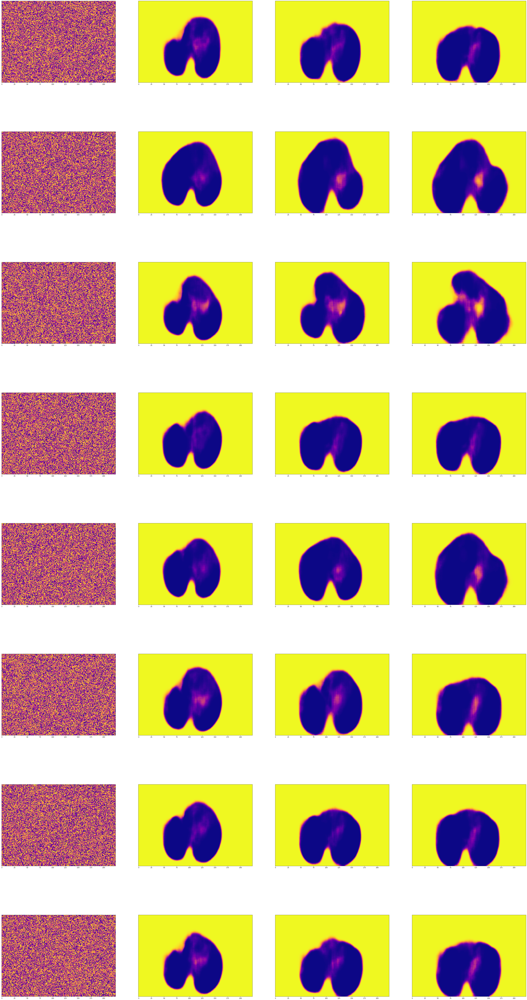

['input_strip_continuous', 'input_cine_segmented_lax_4ch_diastole_categorical']
2020-09-18 11:40:19,382 - plots:2082 - INFO - Plotting 3 reconstructions of TensorMap(strip, (5000, 12), continuous).
2020-09-18 11:40:27,479 - explorations:57 - INFO - Write predictions as PNGs TensorMap:strip, y shape:(8, 5000, 12) labels:(8, 5000, 12) folder:./recipes_output/paired_ecg_segmented_mri_lax_4ch_diastole_cosine_256d_selu/input_cine_segmented_lax_4ch_diastole_categorical_noise/
2020-09-18 11:40:27,480 - explorations:57 - INFO - Write predictions as PNGs TensorMap:cine_segmented_lax_4ch_diastole, y shape:(8, 160, 224, 16) labels:(8, 160, 224, 16) folder:./recipes_output/paired_ecg_segmented_mri_lax_4ch_diastole_cosine_256d_selu/input_cine_segmented_lax_4ch_diastole_categorical_noise/


<Figure size 576x1728 with 0 Axes>

<Figure size 576x1728 with 0 Axes>

<Figure size 576x1728 with 0 Axes>

In [25]:
# IPython imports
%matplotlib inline
import matplotlib.pyplot as plt


test_data, test_labels, test_paths = big_batch_from_minibatch_generator(generate_test, args.test_steps)
test_key = 'input_cine_segmented_lax_4ch_diastole_categorical'
test_shape = test_data[test_key].shape
test_data[test_key] = np.random.random(test_shape)
out_path = os.path.join(args.output_folder, args.id, test_key + '_noise/')
if not os.path.exists(os.path.dirname(out_path)):
    os.makedirs(os.path.dirname(out_path))
noise_preds = plot_ae_towards_attractor(overparameterized_model, test_data, test_labels, test_key, 
                                        test_index=1, rows=8, samples=4, steps = 28)
print(list(test_data.keys()))
_plot_reconstruction(args.tensor_maps_out[0],  test_data['input_strip_continuous'], 
                     noise_preds[0], out_path, test_paths)
predictions_to_pngs(noise_preds, args.tensor_maps_in, args.tensor_maps_out, 
                    test_data, test_labels, test_paths, out_path)

2020-09-18 11:40:27,770 - tensor_generators:504 - INFO - Made a big batch of tensors with key:input_strip_continuous and shape:(8, 5000, 12).
2020-09-18 11:40:27,772 - tensor_generators:504 - INFO - Made a big batch of tensors with key:input_cine_segmented_lax_4ch_diastole_categorical and shape:(8, 160, 224, 16).
2020-09-18 11:40:27,773 - tensor_generators:504 - INFO - Made a big batch of tensors with key:output_strip_continuous and shape:(8, 5000, 12).
2020-09-18 11:40:27,774 - tensor_generators:504 - INFO - Made a big batch of tensors with key:output_cine_segmented_lax_4ch_diastole_categorical and shape:(8, 160, 224, 16).


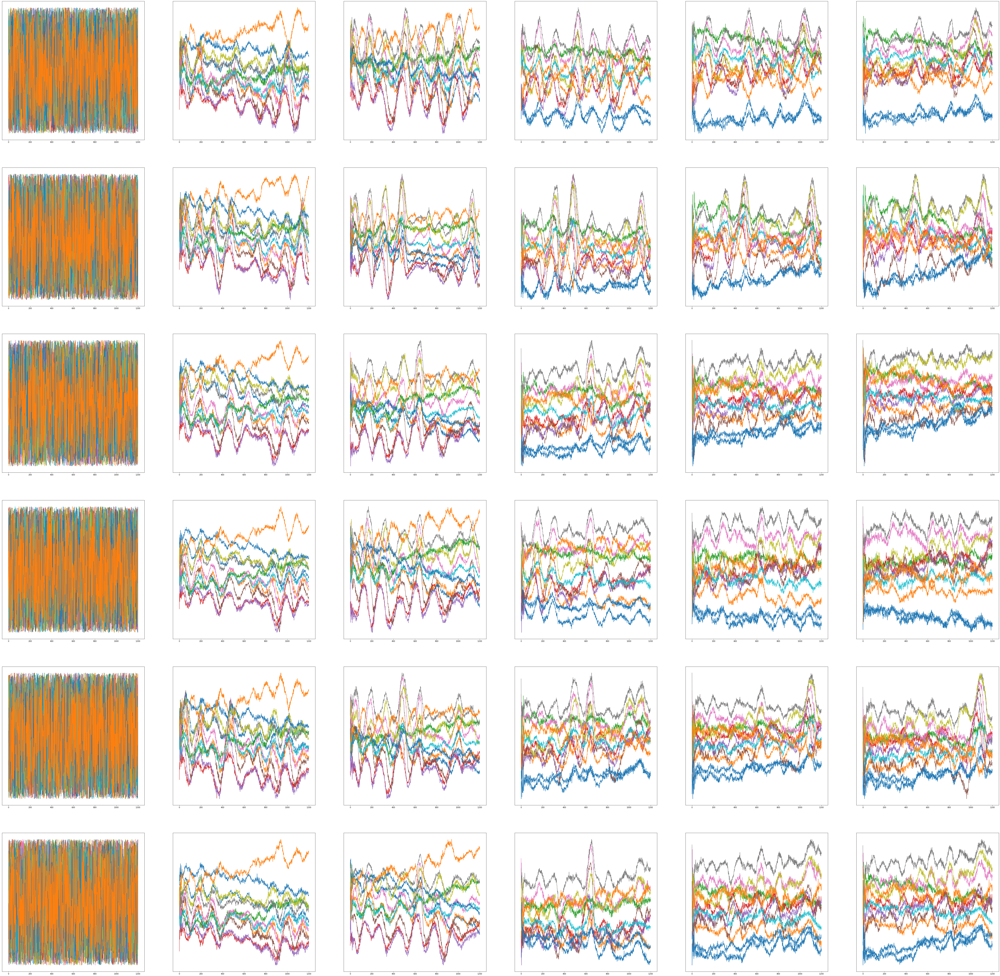

['input_strip_continuous', 'input_cine_segmented_lax_4ch_diastole_categorical']
2020-09-18 11:40:46,757 - plots:2082 - INFO - Plotting 3 reconstructions of TensorMap(strip, (5000, 12), continuous).
2020-09-18 11:40:53,154 - explorations:57 - INFO - Write predictions as PNGs TensorMap:strip, y shape:(8, 5000, 12) labels:(8, 5000, 12) folder:./recipes_output/paired_ecg_segmented_mri_lax_4ch_diastole_cosine_256d_selu/input_strip_continuous_noise/
2020-09-18 11:40:53,155 - explorations:57 - INFO - Write predictions as PNGs TensorMap:cine_segmented_lax_4ch_diastole, y shape:(8, 160, 224, 16) labels:(8, 160, 224, 16) folder:./recipes_output/paired_ecg_segmented_mri_lax_4ch_diastole_cosine_256d_selu/input_strip_continuous_noise/


<Figure size 576x1728 with 0 Axes>

<Figure size 576x1728 with 0 Axes>

<Figure size 576x1728 with 0 Axes>

In [26]:
# IPython imports
%matplotlib inline
import matplotlib.pyplot as plt


test_data, test_labels, test_paths = big_batch_from_minibatch_generator(generate_test, args.test_steps)
test_key = 'input_strip_continuous'
test_shape = test_data[test_key].shape
test_data[test_key] = np.random.random(test_shape)
out_path = os.path.join(args.output_folder, args.id, test_key + '_noise/')
if not os.path.exists(os.path.dirname(out_path)):
    os.makedirs(os.path.dirname(out_path))
noise_preds = plot_ae_towards_attractor(overparameterized_model, test_data, test_labels, test_key, 
                                        test_index=0, rows=6, samples=6, steps = 24)
print(list(test_data.keys()))
_plot_reconstruction(args.tensor_maps_out[0],  test_data['input_strip_continuous'], 
                     noise_preds[0], out_path, test_paths)
predictions_to_pngs(noise_preds, args.tensor_maps_in, args.tensor_maps_out, 
                    test_data, test_labels, test_paths, out_path)

In [8]:
df = pd.read_csv('/home/sam/ml/trained_models/lax_4ch_diastole_autoencode_leaky_converge/tensors_all_union.csv')
df['21003_Age-when-attended-assessment-centre_2_0'].plot.hist(bins=30)
hidden_inference = './recipes_output/ecg_mri_lax_4ch_diastole_paired_autoencoder_2blocks_256d_200_samples/hidden_inference_ecg_mri_lax_4ch_diastole_paired_autoencoder_2blocks_256d_200_samples.tsv'
hidden_inference = './recipes_output/paired_ecg_segmented_mri_lax_4ch_diastole_euclid_256d_swish/hidden_inference_paired_ecg_segmented_mri_lax_4ch_diastole_euclid_256d_swish.tsv'
hidden_inference = './recipes_output/paired_ecg_segmented_mri_lax_4ch_diastole_cosine_256d_selu/hidden_inference_paired_ecg_segmented_mri_lax_4ch_diastole_cosine_256d_selu.tsv'

hidden_inference = './recipes_output/paired_ecg_segmented_mri_lax_4ch_diastole_cosine_64d_selu/hidden_inference_paired_ecg_segmented_mri_lax_4ch_diastole_cosine_64d_selu.tsv'

df2 = pd.read_csv(hidden_inference, sep='\t')
df['fpath'] = pd.to_numeric(df['fpath'], errors='coerce')
df2['sample_id'] = pd.to_numeric(df2['sample_id'], errors='coerce')
#df.info()
latent_df = pd.merge(df, df2, left_on='fpath', right_on='sample_id', how='inner')
#latent_df.info()
df3 = pd.read_csv('/home/sam/tsvs/ttn_disease.tsv', sep='\t')
df4 = pd.read_csv('/home/sam/csvs/has_exome.csv')
latent_df = pd.merge(df3, latent_df, left_on='sample_id', right_on='sample_id', how='right')
latent_df.info()
print(latent_df['has_ttntv'].value_counts())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8520 entries, 0 to 8519
Columns: 177 entries, sample_id to latent_127
dtypes: float64(173), int64(2), object(2)
memory usage: 11.6+ MB
False    2333
True       11
Name: has_ttntv, dtype: int64
<class 'pandas.core.frame.DataFrame'>
Int64Index: 8520 entries, 0 to 8519
Columns: 177 entries, sample_id to latent_127
dtypes: float64(173), int64(2), object(2)
memory usage: 11.6+ MB
False    2333
True       11
Name: has_ttntv, dtype: int64


In [9]:
def pca_on_matrix(matrix, pca_components):
    pca = PCA()
    pca.fit(matrix)
    print(f'PCA explains {100*np.sum(pca.explained_variance_ratio_[:pca_components]):0.1f}% of variance with {pca_components} top PCA components.')
    matrix_reduced = pca.transform(matrix)[:, :pca_components]
    print(f'PCA reduces matrix shape:{matrix_reduced.shape} from matrix shape: {matrix.shape}')
    plot_scree(pca_components, 100*pca.explained_variance_ratio_)
    return pca, matrix_reduced

def plot_scree(pca_components, percent_explained):
    _ = plt.figure(figsize=(6, 4))
    plt.plot(range(len(percent_explained)), percent_explained, 'g.-', linewidth=1)
    plt.axvline(x=pca_components, c='r', linewidth=3)
    label = f'{np.sum(percent_explained[:pca_components]):0.1f}% of variance explained by top {pca_components} of {len(percent_explained)} components'
    plt.text(pca_components+0.02*len(percent_explained), percent_explained[1], label)
    plt.title('Scree Plot')
    plt.xlabel('Principal Components')
    plt.ylabel('% of Variance Explained by Each Component')
    figure_path = f'./results/pca_{pca_components}_of_{len(percent_explained)}_testimonials.png'
    if not os.path.exists(os.path.dirname(figure_path)):
        os.makedirs(os.path.dirname(figure_path))
    plt.savefig(figure_path)
    
def unit_vector(vector):
    """ Returns the unit vector of the vector.  """
    return vector / np.linalg.norm(vector)

def angle_between(v1, v2):
    """ Returns the angle in radians between vectors 'v1' and 'v2'::

            >>> angle_between((1, 0, 0), (0, 1, 0))
            1.5707963267948966
            >>> angle_between((1, 0, 0), (1, 0, 0))
            0.0
            >>> angle_between((1, 0, 0), (-1, 0, 0))
            3.141592653589793
    """
    v1_u = unit_vector(v1)
    v2_u = unit_vector(v2)
    return np.arccos(np.clip(np.dot(v1_u, v2_u), -1.0, 1.0)) * 180 / 3.141592

def directions_in_latent_space(stratify_column, stratify_thresh, split_column, split_thresh, latent_cols, latent_df):
    hit = latent_df.loc[latent_df[stratify_column] >= stratify_thresh][latent_cols].to_numpy()
    miss = latent_df.loc[latent_df[stratify_column] < stratify_thresh][latent_cols].to_numpy()
    miss_mean_vector = np.mean(miss, axis=0)
    hit_mean_vector = np.mean(hit, axis=0)
    strat_vector = hit_mean_vector - miss_mean_vector
    
    hit1 = latent_df.loc[(latent_df[stratify_column] >= stratify_thresh) 
                        & (latent_df[split_column] >= split_thresh)][latent_cols].to_numpy()
    miss1 = latent_df.loc[(latent_df[stratify_column] < stratify_thresh) 
                        & (latent_df[split_column] >= split_thresh)][latent_cols].to_numpy()
    hit2 = latent_df.loc[(latent_df[stratify_column] >= stratify_thresh) 
                        & (latent_df[split_column] < split_thresh)][latent_cols].to_numpy()
    miss2 = latent_df.loc[(latent_df[stratify_column] < stratify_thresh) 
                        & (latent_df[split_column] < split_thresh)][latent_cols].to_numpy()
    miss_mean_vector1 = np.mean(miss1, axis=0)
    hit_mean_vector1 = np.mean(hit1, axis=0)
    angle1 = angle_between(miss_mean_vector1, hit_mean_vector1)
    miss_mean_vector2 = np.mean(miss2, axis=0)
    hit_mean_vector2 = np.mean(hit2, axis=0)
    angle2 = angle_between(miss_mean_vector2, hit_mean_vector2)
    h1_vector = hit_mean_vector1-miss_mean_vector1
    h2_vector = hit_mean_vector2-miss_mean_vector2
    angle3 = angle_between(h1_vector, h2_vector)
    angle4 = angle_between(strat_vector, h1_vector)
    angle5 = angle_between(strat_vector, h2_vector)
    print(f'\n Between {stratify_column}, and splits: {split_column}\n',
          f'Angles h1 and m1: {angle1:.2f}, h2 and m2 {angle2:.2f} h1-m1 and h2-m2 {angle3:.2f} degrees.\n'
          f'stratify threshold: {stratify_thresh}, split thresh: {split_thresh}, \n'
          f'hit_mean_vector2 shape {miss_mean_vector1.shape}, miss1:{hit_mean_vector2.shape} \n'
          f'Hit1 shape {hit1.shape}, miss1:{miss1.shape} threshold:{stratify_thresh}\n'
          f'Hit2 shape {hit2.shape}, miss2:{miss2.shape}\n')

def stratify_latent_space(stratify_column, stratify_thresh, latent_cols, latent_df):
    hit = latent_df.loc[latent_df[stratify_column] >= stratify_thresh][latent_cols].to_numpy()
    miss = latent_df.loc[latent_df[stratify_column] < stratify_thresh][latent_cols].to_numpy()
    miss_mean_vector = np.mean(miss, axis=0)
    hit_mean_vector = np.mean(hit, axis=0)
    angle = angle_between(miss_mean_vector, hit_mean_vector)
    print(f'Angle between {stratify_column} centroid and all others is: {angle:.1f} degrees.\n'
          f'Hit shape {hit.shape}, miss:{miss.shape} threshold:{stratify_thresh}\n'
          f'Distance: {np.linalg.norm(hit_mean_vector-miss_mean_vector):.3f}, Hit std {np.std(hit, axis=1).mean():.3f}, miss std:{np.std(miss, axis=1).mean():.3f}\n')
    
def plot_pcs(sides, color_key):
    f, axes = plt.subplots(sides, sides, figsize=(16, 16))
    for i, ax in enumerate(axes.ravel()):
        colors = latent_df[color_key].to_numpy()
        points = ax.scatter(matrix_reduce[:, i], matrix_reduce[:, i+1], c=colors)
        f.colorbar(points, ax=ax)
        



In [10]:
import matplotlib.pyplot as plt
latent_dimension = 128
latent_cols = [f'latent_{i}' for i in range(latent_dimension)]
pca, matrix_reduce = pca_on_matrix(df2[latent_cols].to_numpy(), 10)
for strat in ['Sex_Female_0_0', 'has_ttntv', 'atrial_fibrillation_or_flutter', 
              'coronary_artery_disease', 'hypertension']:
    stratify_latent_space(strat, 1.0, latent_cols, latent_df)
strats = ['LVEF', 'LVM', 'LVEDV', 'sample_id',
              '21001_Body-mass-index-BMI_0_0', '21003_Age-when-attended-assessment-centre_2_0']
theshes = [45, 100, 150, 3500000, 27.5, 70]
for strat, thresh in zip(strats, theshes):
    stratify_latent_space(strat, thresh, latent_cols, latent_df)

PCA explains 80.5% of variance with 10 top PCA components.
PCA reduces matrix shape:(8520, 10) from matrix shape: (8520, 128)
Angle between Sex_Female_0_0 centroid and all others is: 32.7 degrees.
Hit shape (4396, 128), miss:(4124, 128) threshold:1.0
Distance: 174.751, Hit std 40.602, miss std:42.981

PCA explains 80.5% of variance with 10 top PCA components.
PCA reduces matrix shape:(8520, 10) from matrix shape: (8520, 128)
Angle between Sex_Female_0_0 centroid and all others is: 32.7 degrees.
Hit shape (4396, 128), miss:(4124, 128) threshold:1.0
Distance: 174.751, Hit std 40.602, miss std:42.981

Angle between has_ttntv centroid and all others is: 21.8 degrees.
Hit shape (11, 128), miss:(2333, 128) threshold:1.0
Distance: 115.166, Hit std 42.259, miss std:42.477

Angle between atrial_fibrillation_or_flutter centroid and all others is: 17.3 degrees.
Hit shape (315, 128), miss:(8205, 128) threshold:1.0
Distance: 90.701, Hit std 42.910, miss std:41.709

Angle between coronary_artery_dis

PCA explains 90.2% of variance with 10 top PCA components.
PCA reduces matrix shape:(8520, 10) from matrix shape: (8520, 256)
Angle between Sex_Female_0_0 centroid and all others is: 11.3 degrees.
Hit shape (4396, 256), miss:(4124, 256) threshold:1.0
Distance: 88.969, Hit std 23.570, miss std:26.684

Angle between has_ttntv centroid and all others is: 8.8 degrees.
Hit shape (11, 256), miss:(2333, 256) threshold:1.0
Distance: 61.375, Hit std 23.376, miss std:25.008

Angle between atrial_fibrillation_or_flutter centroid and all others is: 6.5 degrees.
Hit shape (315, 256), miss:(8205, 256) threshold:1.0
Distance: 46.692, Hit std 26.220, miss std:25.033

Angle between coronary_artery_disease centroid and all others is: 5.2 degrees.
Hit shape (319, 256), miss:(8201, 256) threshold:1.0
Distance: 38.844, Hit std 26.073, miss std:25.038

Angle between hypertension centroid and all others is: 5.6 degrees.
Hit shape (2793, 256), miss:(5727, 256) threshold:1.0
Distance: 36.720, Hit std 25.300, m

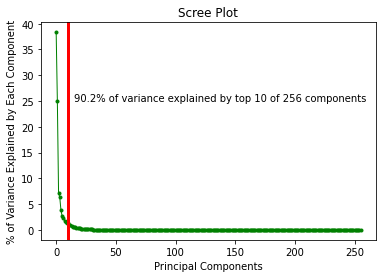

In [13]:
import matplotlib.pyplot as plt
latent_dimension = 256
latent_cols = [f'latent_{256+i}' for i in range(latent_dimension)]
pca, matrix_reduce = pca_on_matrix(df2[latent_cols].to_numpy(), 10)
for strat in ['Sex_Female_0_0', 'has_ttntv', 'atrial_fibrillation_or_flutter', 
              'coronary_artery_disease', 'hypertension']:
    stratify_latent_space(strat, 1.0, latent_cols, latent_df)
strats = ['LVEF', 'LVM', 'LVEDV', 'sample_id',
              '21001_Body-mass-index-BMI_0_0', '21003_Age-when-attended-assessment-centre_2_0']
theshes = [45, 100, 150, 3500000, 27.5, 65]
for strat, thresh in zip(strats, theshes):
    stratify_latent_space(strat, thresh, latent_cols, latent_df)

PCA explains 84.0% of variance with 10 top PCA components.
PCA reduces matrix shape:(8520, 10) from matrix shape: (8520, 512)
Angle between Sex_Female_0_0 centroid and all others is: 12.2 degrees.
Hit shape (4396, 512), miss:(4124, 512) threshold:1.0
Distance: 94.249, Hit std 20.781, miss std:22.567

Angle between has_ttntv centroid and all others is: 16.7 degrees.
Hit shape (11, 512), miss:(2333, 512) threshold:1.0
Distance: 109.302, Hit std 21.416, miss std:21.657

Angle between atrial_fibrillation_or_flutter centroid and all others is: 7.2 degrees.
Hit shape (315, 512), miss:(8205, 512) threshold:1.0
Distance: 51.197, Hit std 22.186, miss std:21.625

Angle between coronary_artery_disease centroid and all others is: 5.5 degrees.
Hit shape (319, 512), miss:(8201, 512) threshold:1.0
Distance: 40.515, Hit std 22.125, miss std:21.627

Angle between hypertension centroid and all others is: 5.6 degrees.
Hit shape (2793, 512), miss:(5727, 512) threshold:1.0
Distance: 37.364, Hit std 21.775,

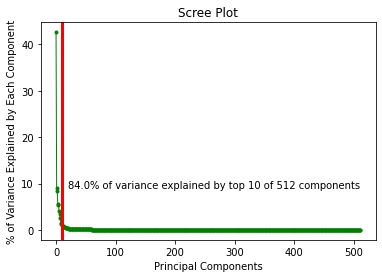

In [14]:
latent_dimension = 512
latent_cols = [f'latent_{i}' for i in range(latent_dimension)]
pca, matrix_reduce = pca_on_matrix(df2[latent_cols].to_numpy(), 10)
for strat in ['Sex_Female_0_0', 'has_ttntv', 'atrial_fibrillation_or_flutter', 
              'coronary_artery_disease', 'hypertension']:
    stratify_latent_space(strat, 1.0, latent_cols, latent_df)
strats = ['LVEF', 'LVM', 'LVEDV', 'sample_id',
              '21001_Body-mass-index-BMI_0_0', '21003_Age-when-attended-assessment-centre_2_0']
theshes = [45, 100, 150, 3500000, 27.5, 65]
for strat, thresh in zip(strats, theshes):
    stratify_latent_space(strat, thresh, latent_cols, latent_df)

PCA explains 90.2% of variance with 10 top PCA components.
PCA reduces matrix shape:(8520, 10) from matrix shape: (8520, 256)

 Between Sex_Female_0_0, and splits: LVEF
 Angles h1 and m1: 11.23, h2 and m2 16.94 h1-m1 and h2-m2 41.60 degrees.
stratify threshold: 1.0, split thresh: 50, 
hit_mean_vector2 shape (256,), miss1:(256,) 
Hit1 shape (539, 256), miss1:(404, 256) threshold:1.0
Hit2 shape (20, 256), miss2:(45, 256)


 Between Sex_Female_0_0, and splits: LVM
 Angles h1 and m1: 14.02, h2 and m2 8.93 h1-m1 and h2-m2 39.05 degrees.
stratify threshold: 1.0, split thresh: 100, 
hit_mean_vector2 shape (256,), miss1:(256,) 
Hit1 shape (18, 256), miss1:(270, 256) threshold:1.0
Hit2 shape (543, 256), miss2:(179, 256)


 Between Sex_Female_0_0, and splits: LVEDV
 Angles h1 and m1: 9.45, h2 and m2 9.27 h1-m1 and h2-m2 15.56 degrees.
stratify threshold: 1.0, split thresh: 150, 
hit_mean_vector2 shape (256,), miss1:(256,) 
Hit1 shape (73, 256), miss1:(297, 256) threshold:1.0
Hit2 shape (488, 256

/usr/local/lib/python3.6/dist-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.6/dist-packages/numpy/core/_methods.py:154: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)


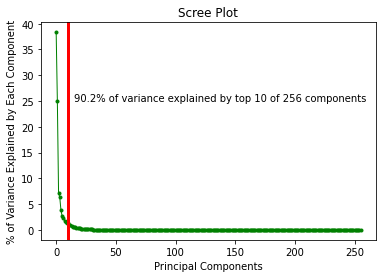

In [15]:
latent_dimension = 256
latent_cols = [f'latent_{256+i}' for i in range(latent_dimension)]
pca, matrix_reduce = pca_on_matrix(df2[latent_cols].to_numpy(), 10)
c_strats = [ 'Sex_Female_0_0', 'has_ttntv']
for c_strat in c_strats:
    strats = ['LVEF', 'LVM', 'LVEDV', 'sample_id',
                  '21001_Body-mass-index-BMI_0_0', '21003_Age-when-attended-assessment-centre_2_0']
    theshes = [50, 100, 150, 3750000, 27.5, 65]
    for strat, thresh in zip(strats, theshes):
        directions_in_latent_space(c_strat, 1.0, strat, thresh, latent_cols, latent_df)

In [17]:
latent_dimension = 256
latent_cols = [f'latent_{256+i}' for i in range(latent_dimension)]
pca, matrix_reduce = pca_on_matrix(df2[latent_cols].to_numpy(), 10)
c_strats = [ 'sample_id']
for c_strat in c_strats:
    strats = ['LVEF', 'LVM', 'LVEDV', 'sample_id',
                  '21001_Body-mass-index-BMI_0_0', '21003_Age-when-attended-assessment-centre_2_0']
    theshes = [50, 100, 150, 3750000, 27.5, 70]
    for strat, thresh in zip(strats, theshes):
        directions_in_latent_space(c_strat, 3750000.0, strat, thresh, latent_cols, latent_df)

PCA explains 58.0% of variance with 10 top PCA components.
PCA reduces matrix shape:(8520, 10) from matrix shape: (8520, 256)

 Between sample_id, and splits: LVEF
 Angles h1 and m1: 31.39, h2 and m2 68.97 h1-m1 and h2-m2 89.28 degrees.
stratify threshold: 3750000.0, split thresh: 50, 
hit_mean_vector2 shape (256,), miss1:(256,) 
Hit1 shape (518, 256), miss1:(425, 256) threshold:3750000.0
Hit2 shape (45, 256), miss2:(20, 256)


 Between sample_id, and splits: LVM
 Angles h1 and m1: 27.75, h2 and m2 22.55 h1-m1 and h2-m2 111.44 degrees.
stratify threshold: 3750000.0, split thresh: 100, 
hit_mean_vector2 shape (256,), miss1:(256,) 
Hit1 shape (155, 256), miss1:(133, 256) threshold:3750000.0
Hit2 shape (409, 256), miss2:(313, 256)


 Between sample_id, and splits: LVEDV
 Angles h1 and m1: 26.08, h2 and m2 22.50 h1-m1 and h2-m2 110.51 degrees.
stratify threshold: 3750000.0, split thresh: 150, 
hit_mean_vector2 shape (256,), miss1:(256,) 
Hit1 shape (206, 256), miss1:(164, 256) threshold:37

/usr/local/lib/python3.6/dist-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.6/dist-packages/numpy/core/_methods.py:154: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)


In [12]:
latent_dimension = 256
latent_cols = [f'latent_{i}' for i in range(latent_dimension)]
ecg_encode = latent_df[latent_cols].to_numpy()
latent_cols = [f'latent_{256+i}' for i in range(latent_dimension)]
mri_encode = latent_df[latent_cols].to_numpy()
diff = np.sqrt(np.einsum('ij, ij->ij', ecg_encode - mri_encode, ecg_encode - mri_encode))
print(diff.shape) 
print(np.mean(diff))

(8520, 256)
0.003681557658629215


In [20]:
print(f"{np.mean(np.sqrt(np.einsum('ij, ij->ij', ecg_encode, ecg_encode)))}")
print(f"{np.mean(np.sqrt(np.einsum('ij, ij->ij', mri_encode, mri_encode)))}")

0.0029449704127661883
0.0021590042387225946


In [17]:
latent_dimension = 256
latent_cols = [f'latent_{i}' for i in range(latent_dimension)]
ecg_encode = latent_df[latent_cols].to_numpy()
latent_cols = [f'latent_{250+i}' for i in range(latent_dimension)]
mri_encode = latent_df[latent_cols].to_numpy()
diff = np.sqrt(np.einsum('ij, ij->ij', ecg_encode - mri_encode, ecg_encode - mri_encode))
print(diff.shape) 
print(np.mean(diff))

(8520, 256)
0.003727992609705619


In [14]:
ch2_random = np.random.random((8520, 256))
ch3_random = np.random.random((8520, 256))
diff = np.sqrt(np.einsum('ij, ij->ij', ch2_random - ch3_random, ch2_random - ch3_random))
print(diff.shape) 
print(np.mean(diff))

(8520, 256)
0.3338310061500321


In [11]:
latent_dimension = 128
latent_cols = [f'latent_{i}' for i in range(latent_dimension)]
all_encode = latent_df[latent_cols].to_numpy()

In [12]:
from ml4h.plots import _plot_reconstruction
for tm in decoders:
    predictions = decoders[tm].predict(all_encode[:4])
    print(predictions.shape)
    out_path = os.path.join(args.output_folder, args.id, 'decodings/')
    if not os.path.exists(os.path.dirname(out_path)):
        os.makedirs(os.path.dirname(out_path))
    samples = list(map(str, list(latent_df['sample_id'])[:10]))
    _plot_reconstruction(tm, predictions, predictions, out_path, samples)

(4, 5000, 12)
2020-09-22 10:26:26,132 - plots:2082 - INFO - Plotting 3 reconstructions of TensorMap(strip, (5000, 12), continuous).
(4, 5000, 12)
2020-09-22 10:26:26,132 - plots:2082 - INFO - Plotting 3 reconstructions of TensorMap(strip, (5000, 12), continuous).
(4, 160, 224, 16)
2020-09-22 10:26:31,862 - plots:2082 - INFO - Plotting 3 reconstructions of TensorMap(cine_segmented_lax_4ch_diastole, (160, 224, 16), categorical).
(4, 160, 224, 16)
2020-09-22 10:26:31,862 - plots:2082 - INFO - Plotting 3 reconstructions of TensorMap(cine_segmented_lax_4ch_diastole, (160, 224, 16), categorical).


In [19]:
print()

[1006219, 1008834, 1009563, 1010383, 1010470, 1010963, 1013589, 1013988, 1014166, 1016070]
[1006219, 1008834, 1009563, 1010383, 1010470, 1010963, 1013589, 1013988, 1014166, 1016070]
